# **Trabajo Grupal: Exploración del precio y clasificación de corte de diamantes**
## **Estudiantes:** Llubitza Linares, Denise Baldivieso, Nicole Góngora
## Universidad Privada Boliviana

El objetivo principal de este proyecto es obtener conclusiones precisas acerca de los atributos de un diamante que le dan un buen precio, así como un buen corte.

- Utilizar los conocimientos aprendidos en la materia para realizar el análisis de datos
- Realizar modelos de aprendizaje automático apropiados para obtener una explicación de los objetivos a lograr
- Analizar cuánto explican las variables ante un objetivo a analizar en el diamante (el precio o el corte)

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving diamonds.csv to diamonds.csv


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
from plotly.offline import iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import os

In [ ]:
diamonds= pd.read_csv('diamonds.csv',index_col = [0])  #Para que la columna indice del csv sea el índice del dataframe y no otra columna
diamonds

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


In [ ]:
diamonds.tail(10)

,carat,cut,color,clarity,depth,table,price,x,y,z
53931,0.71,Premium,E,SI1,60.5,55.0,2756,5.79,5.74,3.49
53932,0.71,Premium,F,SI1,59.8,62.0,2756,5.74,5.73,3.43
53933,0.70,Very Good,E,VS2,60.5,59.0,2757,5.71,5.76,3.47
53934,0.70,Very Good,E,VS2,61.2,59.0,2757,5.69,5.72,3.49
53935,0.72,Premium,D,SI1,62.7,59.0,2757,5.69,5.73,3.58
53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74
53940,0.75,Ideal,D,SI2,62.2,55.0,2757,5.83,5.87,3.64


In [ ]:
diamonds.head(10)

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
6,0.24,Very Good,J,VVS2,62.8,57.0,336,3.94,3.96,2.48
7,0.24,Very Good,I,VVS1,62.3,57.0,336,3.95,3.98,2.47
8,0.26,Very Good,H,SI1,61.9,55.0,337,4.07,4.11,2.53
9,0.22,Fair,E,VS2,65.1,61.0,337,3.87,3.78,2.49
10,0.23,Very Good,H,VS1,59.4,61.0,338,4.00,4.05,2.39


In [ ]:
diamonds.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [ ]:
diamonds.isna().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [ ]:
diamonds.shape

(53940, 10)

In [ ]:
diamonds.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53940 entries, 1 to 53940
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.5+ MB


In [ ]:
diamonds.corr()

,carat,depth,table,price,x,y,z
carat,1.000000,0.028224,0.181618,0.921591,0.975094,0.951722,0.953387
depth,0.028224,1.000000,-0.295779,-0.010647,-0.025289,-0.029341,0.094924
table,0.181618,-0.295779,1.000000,0.127134,0.195344,0.183760,0.150929
price,0.921591,-0.010647,0.127134,1.000000,0.884435,0.865421,0.861249
x,0.975094,-0.025289,0.195344,0.884435,1.000000,0.974701,0.970772
y,0.951722,-0.029341,0.183760,0.865421,0.974701,1.000000,0.952006
z,0.953387,0.094924,0.150929,0.861249,0.970772,0.952006,1.000000


In [ ]:
diamonds.price.describe()

count    53940.000000
mean      3932.799722
std       3989.439738
min        326.000000
25%        950.000000
50%       2401.000000
75%       5324.250000
max      18823.000000
Name: price, dtype: float64

# **Explicación del dataset**

El dataset que se muestra en este trabajo consiste en un registro de diamantes por los siguientes atributos:

- x: Longitud en mm
- y: Ancho en mm
- z: Profundidad en mm
- clarity: Cuán transparente/cristalino es el diamante (I1< SI2 < SI1 < VS2 < VS1 < VVS2 < VVS1 < IF)

![picture](https://fultonjewellery.co.uk/wp-content/uploads/2021/01/clarity-chart-930x530-01.png)

- cut: Calidad del corte

![picture](https://www.brilliance.com/front/img/brilliance-diamond-cut-chart.8d628aea.jpg)

- color: Color (J es el peor y D es el mejor. Se quieren diamantes claros, sin coloracion)

![picture](https://www.gemonediamond.com/wp-content/uploads/2021/04/diamond-color-scale.jpg)
- carat: Quilates
- price: Precio en $Sus (objetivo)
- depth: Porcentaje de profundidad (z/ media(x,y)=2*z/(x+y) )
- table: Ancho de la parte tope del diamante


# **Planteamiento del problema a solucionar**

### A. **Predecir los factores necesarios que justifiquen el precio de un diamante**

1. ¿Las medidas de un diamante (x,y,z) influirán en el precio?
2. ¿Cuanto se relacionan la claridad y el color de un diamante? ¿Alguno o ambos influyen en su precio?
3. ¿A qué quilates se obtiene un buen precio?

### B. **Determinar, con predicciones, la probabilidad de que un diamante pertenezca a un corte determinado**

1. ¿Será el color una propiedad determinante?
2. ¿A mayor depth (nivel de profundidad) y table (Ancho/diámetro del tope), mejor calidad del corte?
3. ¿Cuán frecuente será la probabilidad de obtener un diamante de corte prestigioso (Premium) y del peor (Fair)?
4. ¿A que medidas se obtiene un corte prestigioso (Premium) de diamantes?

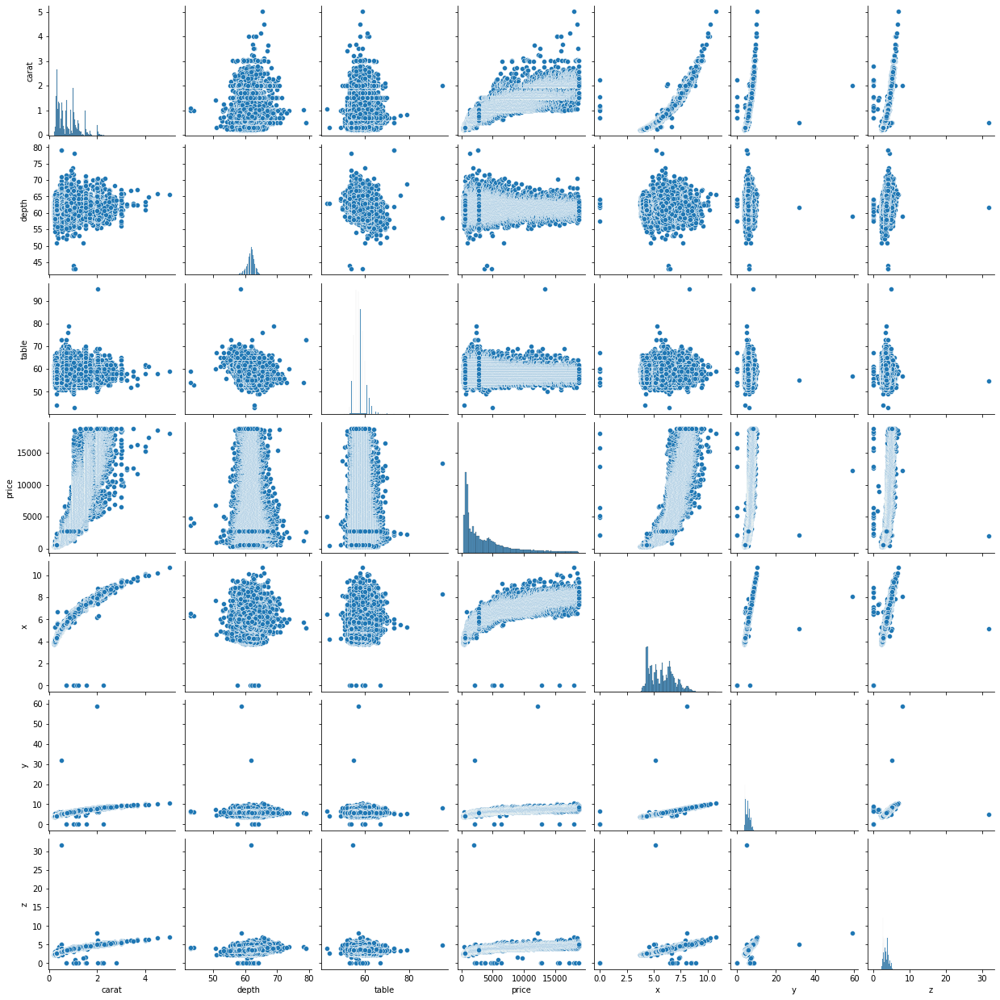

In [ ]:
sns.pairplot(diamonds)

# **Análisis estádistico de variables numéricas**

In [ ]:
diamonds.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


In [ ]:
filternum=filter(lambda colu: (diamonds[colu].dtype != 'object'), diamonds.columns)
lisfil=list(filternum)

In [ ]:
def barplots(dataset,col):

  fig = go.Figure(data=[go.Box(y=dataset[col],
            boxpoints='all', # can also be outliers, or suspectedoutliers, or False
            jitter=0.3, # add some jitter for a better separation between points
            pointpos=-1.8 # relative position of points wrt box
              )])
  titl="Diagrama de cajas de la columna "+col
  fig.update_layout(title=titl,width=1000)
  fig.show()

In [ ]:
def histogram(dataset,col):
  fig = go.Figure(data=[go.Histogram(x=dataset[col],
              marker_color='cyan')])
  titl="Distribución de la columna "+col
  fig.update_layout(title=titl,width=1000)
  fig.show()

In [ ]:
for lis in lisfil:
  histogram(diamonds,lis)

In [ ]:
for lis in lisfil:
  barplots(diamonds,lis)

# **Análisis de frecuencia de clases en variables categóricas**

In [ ]:
filterob=filter(lambda colu: (diamonds[colu].dtype == 'object'), diamonds.columns)
lisfil2=list(filterob)
for cat in lisfil2:
  print(diamonds[cat].value_counts())

Ideal        21551
Premium      13791
Very Good    12082
Good          4906
Fair          1610
Name: cut, dtype: int64
G    11292
E     9797
F     9542
H     8304
D     6775
I     5422
J     2808
Name: color, dtype: int64
SI1     13065
VS2     12258
SI2      9194
VS1      8171
VVS2     5066
VVS1     3655
IF       1790
I1        741
Name: clarity, dtype: int64


In [ ]:
def makeBarPlot(dataset, col):
  gr=dataset.groupby(col)
  fig = go.Figure(data=[go.Bar(x=list(gr.groups.keys()),y=gr[col].count(),marker_color='cyan')])
  titl="Diagrama de cajas de la columna "+col
  fig.update_layout(title=titl,width=1000)
  fig.show()

In [ ]:
for col in lisfil2:
  makeBarPlot(diamonds,col)

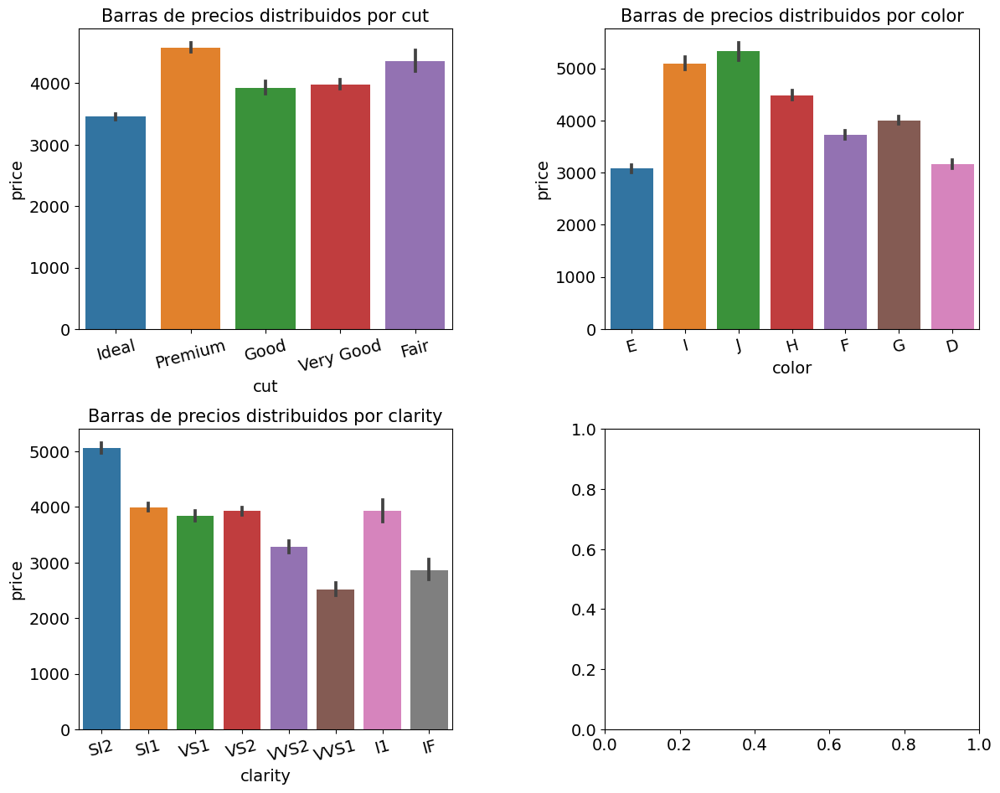

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rc('font', size=14)
mpl.rc('axes', titlesize=15)
figure, axes = plt.subplots(nrows=2, ncols=2) # 2rows 2columns
plt.tight_layout()
figure.set_size_inches(13, 10)

axx=0
axy=0
for col in lisfil2:
  titl="Barras de precios distribuidos por "+col
  sns.barplot(x=col, y='price', data=diamonds, ax=axes[axx, axy])
  axes[axx, axy].set(title=titl)
  axes[axx, axy].tick_params(axis='x', labelrotation=15)
  if axy==1:
    axy=0
    axx+=1
  else:
    axy+=1


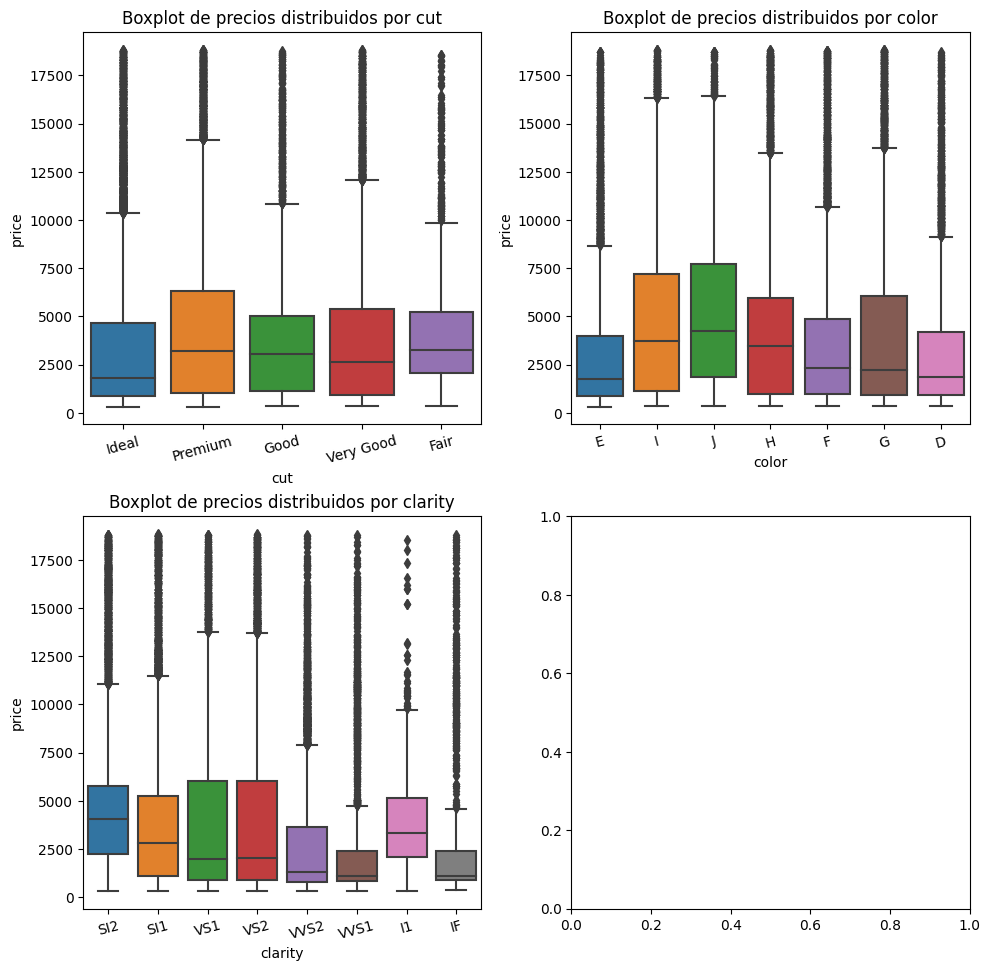

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
figure, axes = plt.subplots(nrows=2, ncols=2) # 2rows 2columns
plt.tight_layout()
figure.set_size_inches(10, 10)

axx=0
axy=0
for col in lisfil2:
  titl="Boxplot de precios distribuidos por "+col
  sns.boxplot(x=col, y='price', data=diamonds, ax=axes[axx, axy])
  axes[axx, axy].set(title=titl)
  axes[axx, axy].tick_params(axis='x', labelrotation=15)
  if axy==1:
    axy=0
    axx+=1
  else:
    axy+=1

# **Ejercicios de análisis exploratorio y graficación en el dataset**


Para revisar y visualizar más de la distribución de las variables y sacar algunas conclusiones previas de la información, realizamos ejercicios de graficación y exploración de datos con el dataset, basados en aquellos de tareas anteriores en la materia

In [ ]:
from plotly.offline import iplot
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import seaborn as sns

## Ejercicio 1

Crea una funcion, preferentemente llamada ejercicio1, que recibiendo el dataframe de diamonds.csv y un valor de colores (Para ver los disponibles, utilizar el comando unique() en la columna "color" del dataframe y seleccionar uno de ellos), calcule el porcentaje y cantidad de diamantes de igual o más de 2.5 quilates ("carat") por cortes (columna "cut").
Graficar los resultados en una torta y una gráfica de barras

In [ ]:
def ejercicio1(dataf,color):
  cortes=dataf["cut"].unique()
  lista=[]
  listacont=[]
  #Siempre utilizar una columna luego del filtro antes del count para que cuente los totales
  totCol=dataf[dataf.color==color].carat.count()
  for corte in cortes:
    #Siempre utilizar una columna luego del filtro antes del count para que cuente los totales
    diamantesFiltro=dataf[(dataf.cut==corte) & ((dataf.color==color) & (dataf.carat>=2.5) )].carat.count()
    listacont.append(diamantesFiltro)
    porcen=round(diamantesFiltro/totCol*100,2)
    lista.append(porcen)
  return lista,listacont,cortes

In [ ]:
diamonds.color.unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [ ]:
# Queremos del peor color=J
valuesJ,contJ,labs=ejercicio1(diamonds,"J")
valuesJ

fig=make_subplots(rows=1,cols=2,subplot_titles=("Torta de cortes por color J","Barras de cantidades de cortes del color J"),specs=[[{'type':'domain'},{'type':'xy'}]])
fig.add_trace(go.Pie(values=valuesJ,labels=labs),row=1,col=1)
fig.add_trace(go.Bar(x=labs,y=contJ,marker_color='cyan'),row=1,col=2)
fig.update_layout(showlegend=True)
fig.show()

In [ ]:
# Queremos del mejor color, D
valuesD,contD,labs=ejercicio1(diamonds,"D")
valuesD

fig=make_subplots(rows=1,cols=2,subplot_titles=("Torta de cortes por color D","Barras de cantidades de cortes del color D"),specs=[[{'type':'domain'},{'type':'xy'}]])
fig.add_trace(go.Pie(values=valuesD,labels=labs),row=1,col=1)
fig.add_trace(go.Bar(x=labs,y=contD,marker_color='cyan'),row=1,col=2)
fig.update_layout(showlegend=True)
fig.show()

Gracias a esta gráfica, se puede observar que, para aquellos diamantes con más de 2.5 quilates, hay más con una peor coloración de gema (J) en cortes Premium e Ideal, que con la mejor (D) (solo solo cuatro unidades, cada una en una cateogría de corte diferente a Good)

## Ejercicio 2

Crea una funcion, preferentemente llamada ejercicio2, que recibiendo el dataframe de diamonds.csv y un tipo de claridad (clarity. Para ver los disponibles, utilizar el comando unique() en la columna), tenga los valores de medida (x,y,z) listos para graficarlos en sus histogramas respectivos

In [ ]:
def ejercicio2(dataf, clarity):
  listx=dataf[dataf["clarity"]==clarity].x
  listy=dataf[dataf["clarity"]==clarity].y
  listz=dataf[dataf["clarity"]==clarity].z
  return listx, listy, listz

In [ ]:
diamonds.clarity.unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [ ]:
valx,valy,valz=ejercicio2(diamonds,'IF') #Mejor claridad
fig=make_subplots(rows=1,cols=3,subplot_titles=("X=Longitud (mm)", "Y=Ancho (mm)", "Z=Profundidad (mm)"))
fig.add_trace(go.Histogram(x=valx,marker_color='blue'),row=1,col=1)
fig.add_trace(go.Histogram(x=valy,marker_color='red'),row=1,col=2)
fig.add_trace(go.Histogram(x=valz,marker_color='green'),row=1,col=3)
fig.update_layout(showlegend=False,title_text="Medidas de Diamantes de Claridad IF")
fig.show()

In [ ]:
valx,valy,valz=ejercicio2(diamonds,'SI2') #Peor claridad
fig=make_subplots(rows=1,cols=3,subplot_titles=("X=Longitud (mm)", "Y=Ancho (mm)", "Z=Profundidad (mm)"))
fig.add_trace(go.Histogram(x=valx,marker_color='blue'),row=1,col=1)
fig.add_trace(go.Histogram(x=valy,marker_color='red'),row=1,col=2)
fig.add_trace(go.Histogram(x=valz,marker_color='green'),row=1,col=3)
fig.update_layout(showlegend=False,title_text="Medidas de Diamantes de Claridad SI2")
fig.show()

**Para aquellos diamantes con una peor claridad:**
Los tamaños en los que estos pueden encontrarse son aproximadamente de 4 a 9 mm de largo (x), 4 a 9 mm de ancho (y) y 2.50 a 5.50 mm de alto (z).

**Para aquellos diamantes con la mejor claridad:**
Los tamaños en los que estos pueden encontrarse (en una cantidad mejor distribuida) son aproximadamente de 4 a 6 mm de largo (x), 4 a 6 mm de ancho (y) y 2.50 a 3.70 mm de alto (z).


## Ejercicio 3

Crea una funcion, preferentemente llamada ejercicio3, que recibiendo el dataframe de diamonds.csv y un corte (cut), haga un mapa de calor o histograma2D sobre la relación entre el precio y los quilates de un diamante según su corte

In [ ]:
def ejercicio3(dataf,corte):
  filter=dataf[dataf.cut==corte]
  precio=filter.price
  quilate=filter.carat
  fig = go.Figure()
  fig.add_trace(go.Histogram2d(x=quilate,y=precio))
  titl="Mapa de calor de diamantes de corte "+corte
  fig.update_layout(title=titl,xaxis_title="Precios", yaxis_title="Quilates")
  fig.show()

In [ ]:
ejercicio3(diamonds,"Fair")

In [ ]:
ejercicio3(diamonds,"Premium")

**Para aquellos diamantes con una corte Fair (Regular):**
Pueden ser encontrados más frecuentemente (194 unidades) con precios de 2000 a 4000 dólares y con un peso de 0.8 a 1 quilates.

**Para aquellos diamantes con una corte Premium:**
Pueden ser encontrados más frecuentemente (2003 unidades) con precios menores a 1000 dólares y con un peso de 0.25 a 0.34 quilates.


## Ejercicio 4

Crea una funcion, preferentemente llamada ejercicio4, que recibiendo el dataframe de diamonds.csv y un modo (0==Menores, 1==Igual o mayores), calcule listas del valor de profundidad (depth) y el precio según su comparación de la media de quilates; y las devuelva al mismo tiempo

Ej, si llama a la función ejercicio2 así ejercicio2(diamonds,0), todos los valores cuyos quilates fueran menor a la media (mean) serán escogidos.

Graficar el resultado en un scatter, con "x" siendo la lista de depths y "y" siendo la lista de precios obtenidas de la función

In [ ]:
def ejercicio4(dataframe,modo):
  total=dataframe["depth"].mean()
  if modo == 0:
    filtro = dataframe[(dataframe.depth <total)]
  elif modo==1:
    filtro = dataframe[(dataframe.depth >=total)]
  depths=filtro["depth"]
  precios=filtro["price"]
  return depths,precios


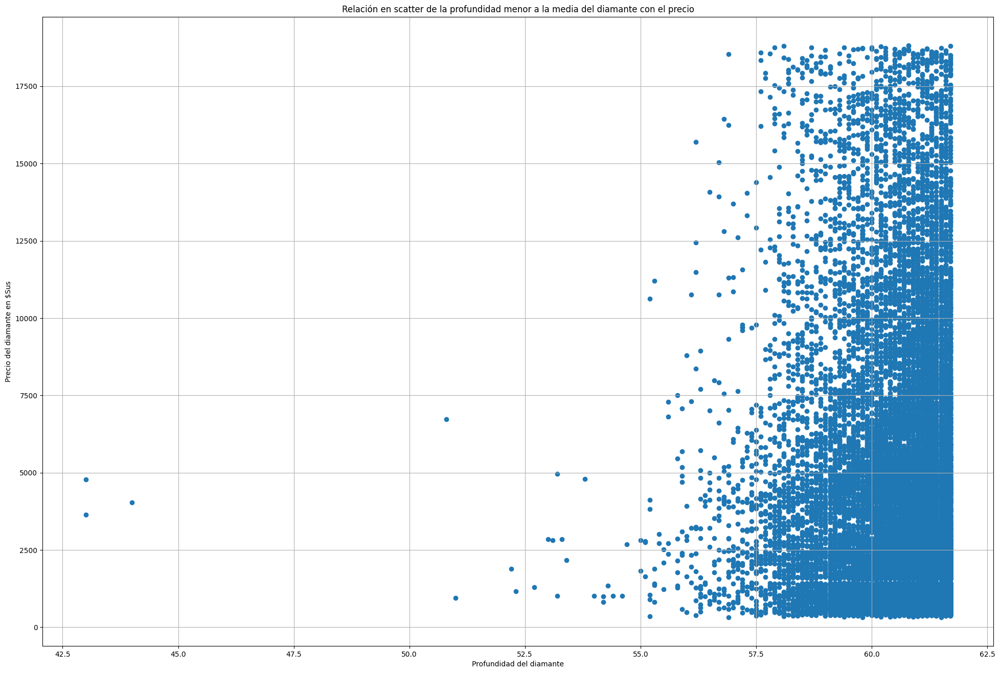

In [ ]:
x,y=ejercicio4(diamonds,0)
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(24,16))
# Dibujamos las coordenadas
plt.scatter(x,y)
plt.grid()
plt.title("Relación en scatter de la profundidad menor a la media del diamante con el precio")
plt.xlabel("Profundidad del diamante")
plt.ylabel("Precio del diamante en $Sus")
# Mostrar grafico
plt.show()

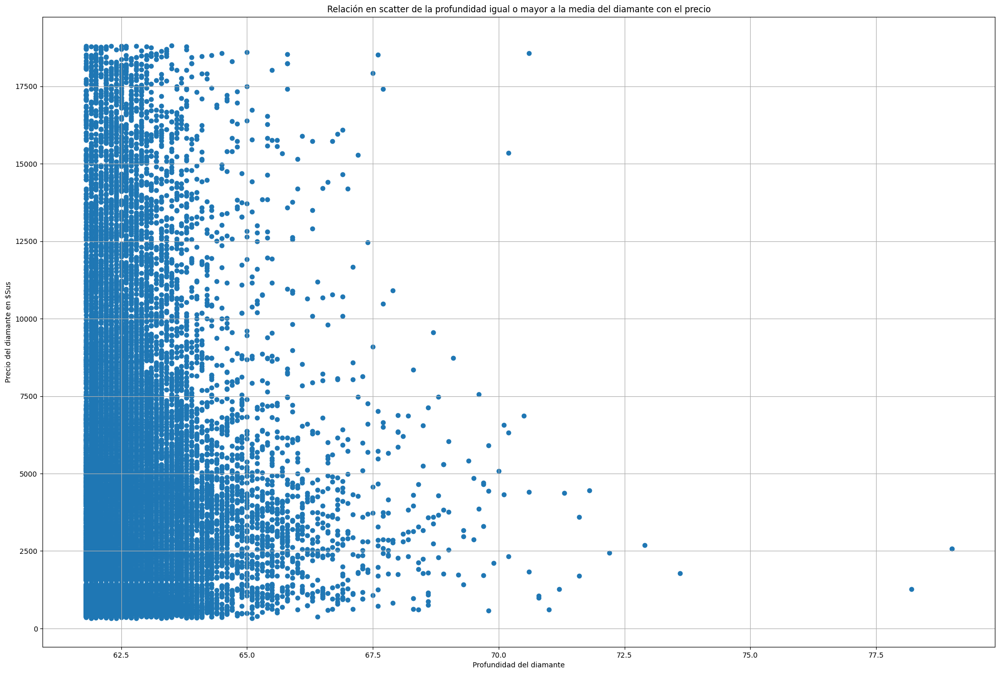

In [ ]:
x,y=ejercicio4(diamonds,1)
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(24,16))
# Dibujamos las coordenadas
plt.scatter(x,y)
plt.grid()
plt.title("Relación en scatter de la profundidad igual o mayor a la media del diamante con el precio")
plt.xlabel("Profundidad del diamante")
plt.ylabel("Precio del diamante en $Sus")
# Mostrar grafico
plt.show()

Gracias al análisis de las dos gráficas correspondientes a las dos medias, puede observarse que hay una presencia mayor de diamantes en un precio menor a 15 mil dólares (donde la línea de puntos no esté tan separada) cuando el ancho de su tope (table) este en un rango de 57.5 a 65 mm

## Ejercicio 5

Crea una funcion, preferentemente llamada ejercicio5, que recibiendo el dataframe de diamonds.csv, devuelva no solamente las filas en las que hubo diamantes de buen corte ("Premium") y de quilates igual o más a 0.25, sino tambien una lista de sus precios.

Mostrar las filas (como un dataframe, similar a los ejercicios del Titanic), y aparte, un histograma de los precios con la lista obtenida

In [ ]:
def ejercicio5(dataframe):
  filtro = dataframe[(dataframe.cut =="Premium") & (dataframe.carat>= 0.25)]
  precios=filtro["price"]
  return filtro,precios

In [ ]:
filas,listaprecios=ejercicio5(diamonds)
filas

,carat,cut,color,clarity,depth,table,price,x,y,z
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
16,0.32,Premium,E,I1,60.9,58.0,345,4.38,4.42,2.68
46,0.29,Premium,F,SI1,62.4,58.0,403,4.24,4.26,2.65
57,0.30,Premium,J,SI2,59.3,61.0,405,4.43,4.38,2.61
62,0.30,Premium,D,SI1,62.6,59.0,552,4.23,4.27,2.66
...,...,...,...,...,...,...,...,...,...,...
53929,0.79,Premium,E,SI2,61.4,58.0,2756,6.03,5.96,3.68
53931,0.71,Premium,E,SI1,60.5,55.0,2756,5.79,5.74,3.49
53932,0.71,Premium,F,SI1,59.8,62.0,2756,5.74,5.73,3.43
53935,0.72,Premium,D,SI1,62.7,59.0,2757,5.69,5.73,3.58


In [ ]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=listaprecios))
fig.update_layout(title="Histograma de precios de diamantes premium de 0.25 quilates o más",xaxis_title="Precios", yaxis_title="# Diamantes")
fig.show()

La distribución de los precios de los diamantes es muy irregular, habiendo un sesgo que se inclina hacia la izquierda: hay más diamantes con un precio de 400 a 1200 dólares que precios mayores.

## Ejercicio 6

Crea una funcion, preferentemente llamada ejercicio6, que recibiendo el dataframe de diamonds.csv, devuelva un gráfico de barras de la media del tope del diamante (table) por cada categoría de corte (cut).



In [ ]:
def generateColors(leng):
  np.random.seed(2022)
  string = "0123456789abcdef"
  arayCol=[]
  for i in range(leng):
    col="#"
    for j in range(6):
      #Al string, escribirle cualquier caracter seleccionado del string
      col+=string[np.random.randint(0,len(string))]
      #np.random.randint(min,max) Selecciona un int random, entero
    #Ua vez generado el código de color, agragarlo a la lista
    arayCol.append(col)
  return arayCol

In [ ]:

def ejercicio6(dataframe):
  mpl.rcParams.update(mpl.rcParamsDefault)
  labels=[] #labels de cortes
  means=[] #medias
  for cuts in dataframe.cut.unique(): #En este tipo de for, itera no por números o indices, sino por cada valor que saque del array
    labels.append(cuts) #Llenando los labels
    classe=dataframe[(dataframe.cut ==cuts)] #Filtrando el dataframe por corte, extraido del iterador
    medi=classe["table"].mean() #De esa dataframe filtrada, sacar la media
    means.append(medi) #Llenando las medias

  x_pos=np.arange(len(labels)) #Generando las posiciones según el número de labels
  plt.figure(figsize=(14,8)) #Agrandando el tamaño del gráfico (SIEMPRE antes del plt.plot/bar/etc)
  plt.bar(x_pos,means,color=generateColors(len(labels))) #x= las posiciones 0 a 4, y=medias
  plt.title("Gráfica de barras de las medias del tope de diamante en cada tipo de corte de diamante")
  plt.xlabel("Categorías de cortes")
  plt.ylabel("Ancho del tope del diamante")
  plt.xticks(x_pos,labels) #(las posiciones 0 a 4, labels)
  plt.show()

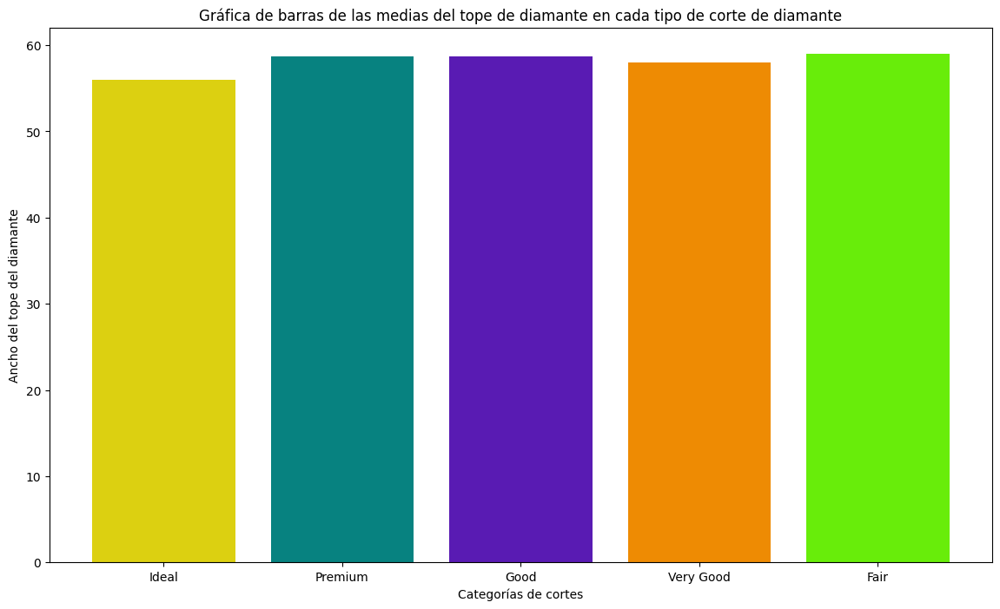

In [ ]:
ejercicio6(diamonds)


Gracias a la gráfica, se puede observar que los diamantes de cortes Premium, Bueno y Regular tienen una media del ancho del tope cerca a los 60 mm, seguidos ligeramente de los diamantes de calidad de corte Muy Bueno e Ideal.

## Ejercicio 7

Crea una funcion, preferentemente llamada ejercicio7, que recibiendo el dataframe de diamonds.csv, un color y una claridad; devuelva un dataframe con las filas cuyos colores y claridades coincidan con los indicados; así como una lista (Devolver el dataframe filtrado, y la columna de precios).
Así mismo, generar un gráfico de linea-punto que tome como x los registros (Pista: una lista que vaya de 1 al número de filas del dataframe obtenido funcionaría) y "y" los precios registrados por fila

In [ ]:
def ejercicio7(dataf, color, clarity):
  mpl.rcParams.update(mpl.rcParamsDefault)
  dataFilter=dataf[(dataf["clarity"]==clarity) & (dataf["color"]==color)]#Para simplificar las filas
  x=list(range(0,len(dataFilter)))# Lista del 1 a n filas del filtro
  y=dataFilter["price"]
  plt.figure(figsize=(16,10))
  titl="Gráfica de línea del precio de diamantes de claridad "+clarity+" y color "+color
  # Dibujamos las coordenadas
  plt.plot(x,y,"r--") #Línea de proyección
  plt.plot(x,y,"m.") #Puntos de registro
  plt.grid()
  plt.title(titl)
  plt.xlabel("# de registros")
  plt.ylabel("Precio del diamante en $Sus")
  # Mostrar grafico
  plt.show()
  return dataFilter

In [ ]:
diamonds.color.unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [ ]:
diamonds.clarity.unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

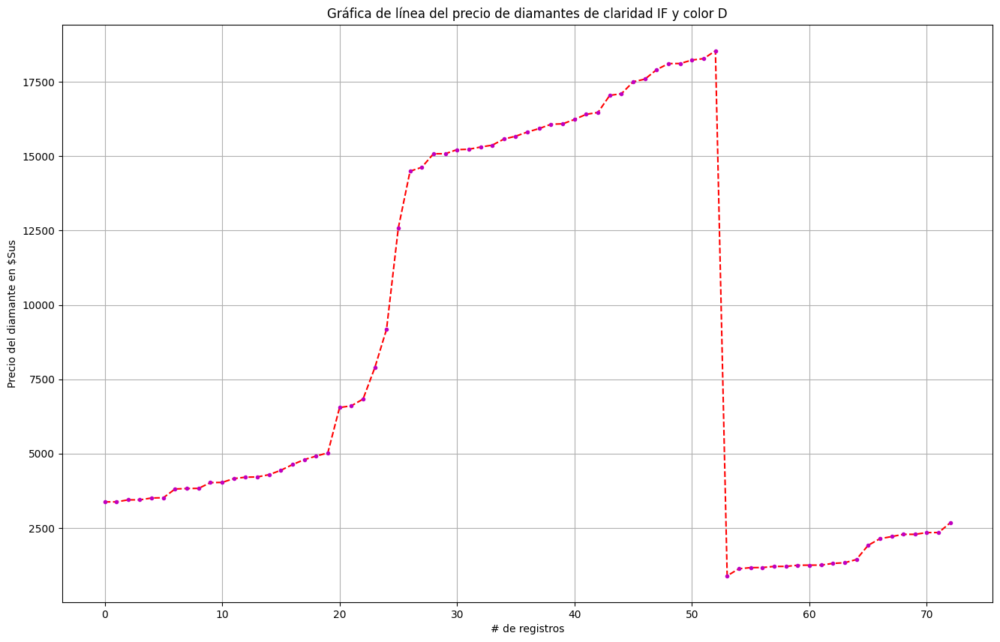

,carat,cut,color,clarity,depth,table,price,x,y,z
3343,0.50,Good,D,IF,63.2,59.0,3378,4.99,5.04,3.17
3344,0.50,Very Good,D,IF,62.9,59.0,3378,4.99,5.09,3.17
3681,0.51,Ideal,D,IF,62.0,56.0,3446,5.14,5.18,3.20
3683,0.51,Ideal,D,IF,62.1,55.0,3446,5.12,5.13,3.19
3972,0.55,Good,D,IF,58.0,62.0,3509,5.31,5.41,3.12
...,...,...,...,...,...,...,...,...,...,...
50672,0.34,Ideal,D,IF,62.1,57.0,2287,4.46,4.52,2.79
50673,0.34,Ideal,D,IF,59.8,57.0,2287,4.57,4.59,2.74
51174,0.34,Ideal,D,IF,62.1,57.0,2346,4.52,4.46,2.79
51175,0.34,Ideal,D,IF,59.8,57.0,2346,4.59,4.57,2.74


In [ ]:
dataframeDIF=ejercicio7(diamonds,"D","IF") #Mejor Color, mejor claridad
dataframeDIF

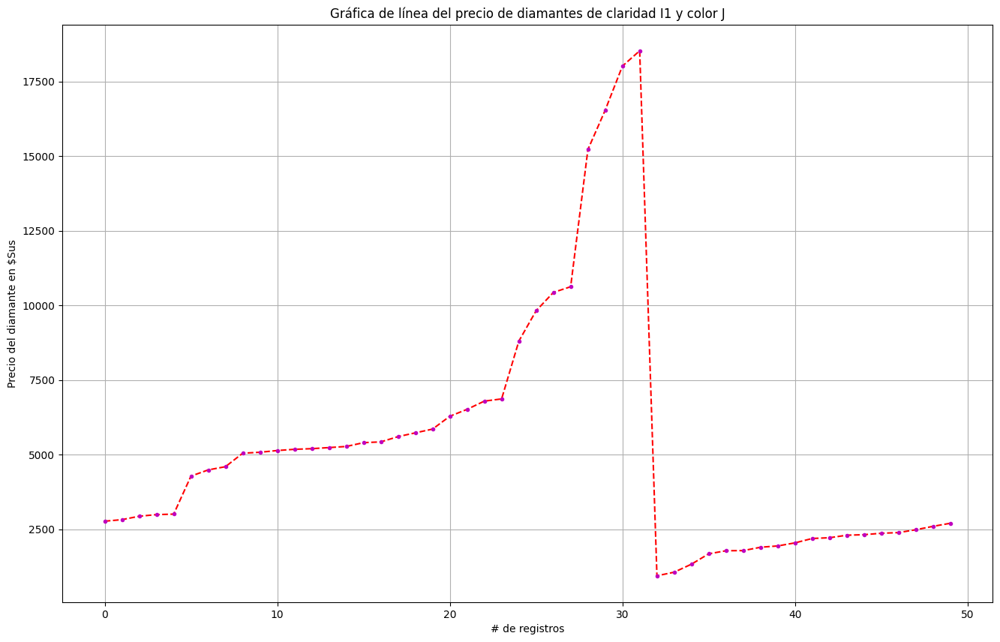

,carat,cut,color,clarity,depth,table,price,x,y,z
173,1.17,Very Good,J,I1,60.2,61.0,2774,6.83,6.90,4.13
526,1.17,Premium,J,I1,60.2,61.0,2825,6.90,6.83,4.13
1225,1.24,Very Good,J,I1,61.9,55.0,2940,6.85,6.92,4.26
1511,1.24,Premium,J,I1,61.9,55.0,2994,6.92,6.85,4.26
1598,1.20,Fair,J,I1,64.9,59.0,3011,6.61,6.54,4.27
7774,1.50,Fair,J,I1,68.8,57.0,4284,6.94,6.87,4.75
8904,1.54,Good,J,I1,61.7,60.0,4492,7.26,7.32,4.50
9463,1.51,Very Good,J,I1,63.3,57.0,4600,7.31,7.23,4.60
11635,2.00,Premium,J,I1,61.5,59.0,5051,8.11,8.06,4.97
11779,1.83,Fair,J,I1,70.0,58.0,5083,7.34,7.28,5.12


In [ ]:
dataframeJI1=ejercicio7(diamonds,"J","I1") #Peor color, peor calidad
dataframeJI1

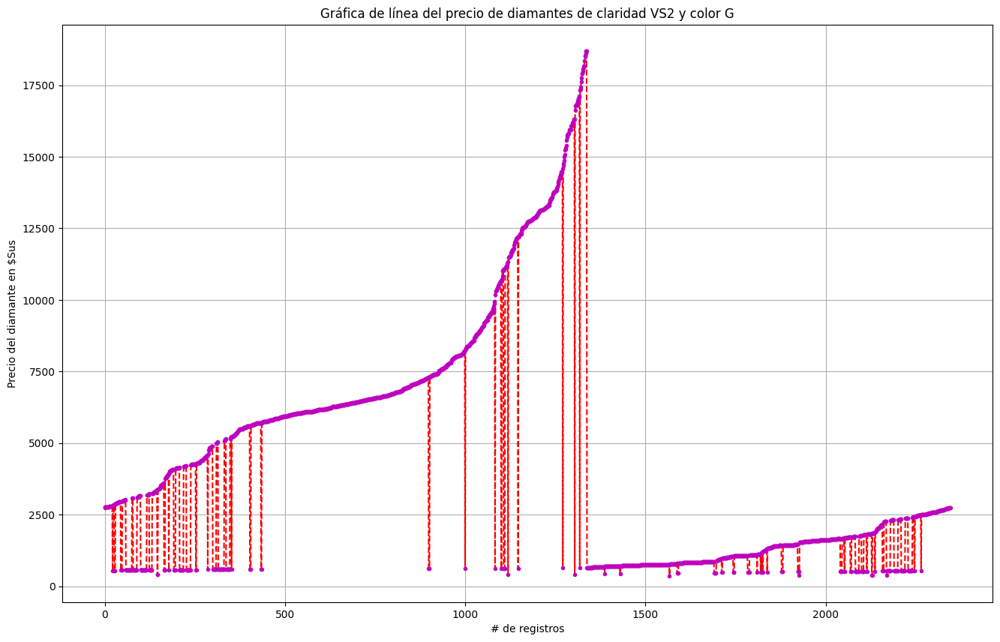

,carat,cut,color,clarity,depth,table,price,x,y,z
93,0.70,Ideal,G,VS2,61.6,56.0,2757,5.70,5.67,3.50
104,0.75,Premium,G,VS2,61.7,58.0,2760,5.85,5.79,3.59
118,0.71,Ideal,G,VS2,62.4,54.0,2762,5.72,5.76,3.58
141,0.71,Premium,G,VS2,60.9,57.0,2766,5.78,5.75,3.51
142,0.71,Premium,G,VS2,59.8,56.0,2766,5.89,5.81,3.50
...,...,...,...,...,...,...,...,...,...,...
53808,0.72,Very Good,G,VS2,63.1,57.0,2732,5.74,5.71,3.61
53821,0.71,Premium,G,VS2,63.0,56.0,2735,5.70,5.69,3.59
53868,0.76,Premium,G,VS2,61.8,58.0,2744,5.85,5.89,3.63
53881,0.73,Premium,G,VS2,60.7,58.0,2746,5.82,5.87,3.55


In [ ]:
dataframeGVS2=ejercicio7(diamonds,"G","VS2") #Color casi invisible, claridad ligeramente baja
dataframeGVS2

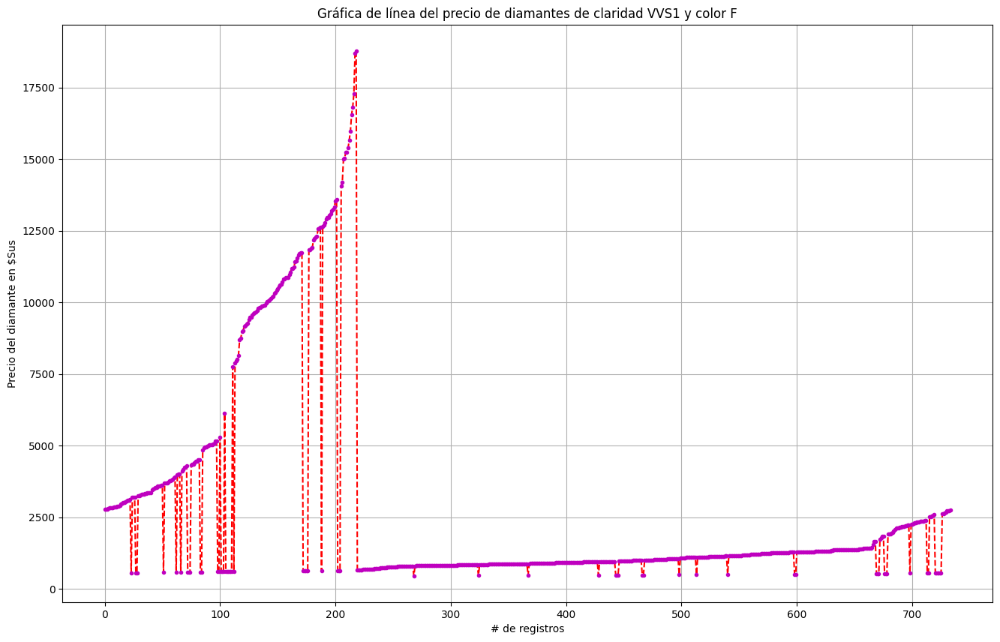

,carat,cut,color,clarity,depth,table,price,x,y,z
169,0.58,Ideal,F,VVS1,61.7,56.0,2772,5.33,5.37,3.30
208,0.52,Ideal,F,VVS1,61.3,55.0,2778,5.19,5.22,3.19
234,0.51,Ideal,F,VVS1,62.0,57.0,2787,5.11,5.15,3.18
426,0.51,Ideal,F,VVS1,62.0,57.0,2812,5.15,5.11,3.18
553,0.53,Ideal,F,VVS1,60.9,57.0,2830,5.23,5.29,3.19
...,...,...,...,...,...,...,...,...,...,...
53487,0.57,Ideal,F,VVS1,62.5,56.0,2682,5.27,5.32,3.31
53690,0.55,Ideal,F,VVS1,60.6,57.0,2716,5.33,5.36,3.24
53770,0.51,Ideal,F,VVS1,61.4,56.0,2726,5.15,5.17,3.17
53782,0.58,Ideal,F,VVS1,61.6,57.0,2728,5.33,5.38,3.30


In [ ]:
dataframeGVS2=ejercicio7(diamonds,"F","VVS1") #Color casi transparente, claridad ligeramente alta
dataframeGVS2

Con las gráficas desarrolladas, se puede observar que, durante el lapso de los registros, hay una progresión irregular de los costos de los diamantes:

**Para diamantes de calidades extremas (Peor/mejor color/claridad)**

Hay un aumento de precios considerable que aumenta en una escala grande pasando del 1/4 de sus registros hasta cerca a los 18 mil dólares, y que decrece repentinamente al llegar a 3/4 de su información. Esto podría indicar que, por lo general, hay una tendencia de valores más altos en la mayoría de los registros por cada grupo de color/claridad.

**Para diamantes de calidades parciales (Color/claridad intermedios)**

En el caso de los diamantes con una claridad ligeramente alta y un color casi cristalino, hay un aumento gradual de sus precios hasta llegar al 1/4 de sus registros hasta cerca a los 18 mil dólares, donde los costos se reducen a cantidades menores a 2500 dólares.

En el caso de los diamantes con una claridad ligeramente baja y un color casi invisible, los precios llegan a su tope máximo de manera casi suave durante la primera mitad de los registros, reduciendose posteriormente a cantidades menores a 2500 dólares.

En ambos casos, la progresión de puntos no es perfecta, habiendo descensos en uno que otro registro durante el aumento de los precios


## Ejercicio 8

Crea una funcion, preferentemente llamada ejercicio8, que recibiendo el dataframe de diamonds.csv, devuelva los porcentajes y cantidades de diamantes por colores, siendo sólo los que sus x, y y z sean mayores o iguales a las medias de las columnas "x", "y" y "z" respectivamente

Graficar los resultados en una torta, y un diagrama de barras

In [ ]:

# En este, como pista, te puedes ayudar de mi ejercicio 1 (Nicole)
def ejercicio8(dataf):
  lista=[]
  listacont=[]
  totCol=dataf.carat.count()#Para el total de columnas en el dataframe
  colors=dataf.color.unique()#Para obtener los colores únicos
  meanx=dataf.x.mean()
  meany=dataf.y.mean()
  meanz=dataf.z.mean()
  for color in colors:
    diamantesFiltro=dataf[((dataf.z>=meanz)&(dataf.y>=meany)) & ((dataf.color==color) & (dataf.x>=meanx) )].carat.count()#filtrando y contando las filas
    listacont.append(diamantesFiltro)#Para las barras
    porcen=round(diamantesFiltro/totCol*100,2)
    lista.append(porcen)#Para la torta
  return lista,listacont,colors

In [ ]:
valuesC,contC,colors=ejercicio8(diamonds)

fig=make_subplots(rows=1,cols=2,subplot_titles=("Torta de colores","Barras de cantidades de colores"),specs=[[{'type':'domain'},{'type':'xy'}]])
fig.add_trace(go.Pie(values=valuesC,labels=colors),row=1,col=1)
fig.add_trace(go.Bar(x=colors,y=contC,marker_color='cyan'),row=1,col=2)
fig.update_layout(showlegend=False, autosize=True,title_text="Gráficas de colores de diamantes con valores x, y, z encima de la media")
fig.show()

Gracias a esta gráfica, se puede observar que hay un gran número de diamantes con valores de largo, ancho y alto (x y z) mayores o iguales a las medias respectivas:

- Hay 5032 diamantes de color de tipo G, siendo el 20.5% de estos registros.
- Como segundo lugar, hay 4713 diamantes de color H, uno de los menos cristalinos, el 19.2% de los registros
- Como tercer, cuarto y quinto grupo con más distribución, se tienen a los diamantes de color F, I y E con 3997, 3326 y 3235 unidades respectivamente (16.3%, 13.5% y 13.2%)
- Por último, los diamantes con valores extremos D (el mejor color) y J (el peor) tienen menos frecuencia en este conjunto, con sólo 2261 y 2000 unidades respectivas (9.2% y 8.14%)

## Ejercicio 9

Crea una funcion, preferentemente llamada ejercicio9, que recibiendo el dataframe de diamonds.csv, devuelva un gráfico de scatter con los n primeros registros del ancho del tope (table) de los diamantes (con "x" siendo un range de 1 a n registros y "y" las profundidades), y en el mismo gráfico, una línea recta que describa la media del table

In [ ]:
def ejercicio9(dataframe,reg):
  meane=dataframe["table"].mean()#La media en general del dataframe
  dataframe=dataframe.iloc[:reg]#Para obtener de 0 a reg filas
  x=range(0,len(dataframe))#un rango de 0 al # de filas del dataframe
  y=dataframe["table"]#los datos de table del dataframe
  plt.scatter(x,y,c='cyan')
  listofmedia=[meane for i in range(0,len(dataframe))]#haciendo una lista de 0 a reg filas con el valor de la media en general
  yl=listofmedia
  plt.plot(x,yl,'g--')#creando la línea recta
  titl="Gráfica de scatter con los primeros "+str(reg)+" registros del ancho del tope del diamante"
  plt.title(titl)
  plt.xlabel("# de registros")
  plt.ylabel("Ancho del tope (table) en mm")
  plt.grid()
  plt.show()

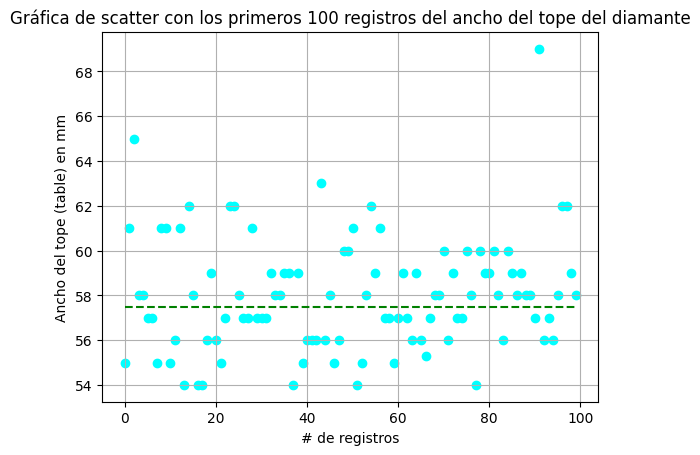

In [ ]:
ejercicio9(diamonds,100)

A partir de esta visualización de scatter, se puede apreciar que existe una distribución casi uniforme de los puntos, sin una progresión lineal visible, y que la mayoría de los diamantes tienen un ancho de tope mayor a la media de esta medida. Es decir, sus topes no sólo son mas anchos, sino que podrían permitir un peso de quilates mayor y medidas más grandes

#**Determinando los métodos de aprendizaje automático para los dos problemas de análisis**

Para el problema A, se escogió un árbol de decisión junto a un random forest para predecir el rango y aproximación del precio de un diamante. El primer algoritmo puede ayudar a determinar qué valores son más importantes en el análisis del costo de una piedra preciosa, y cuánto sería el efecto de la correlación entre las variables de análisis contra el precio. Con esto, se podría responder a las 3 preguntas planteadas. Así mismo, el segundo algoritmo puede dar mayor libertad a las variables de relacionarse entre ellas y con el precio, dando posibles mejores resultados de la conexión entre los atributos de un diamante ante su precio

Para el problema B, en cambio, se escogió un análisis a base de clasificación por K-Nearest Neighbors y Naive-Bayes para determinar la pertenencia de un diamante a un tipo de corte por sus atributos y las probabilidades que esta predicción tiene. Esta decisión se debe no sólamente al deseo de aplicar al menos uno de los métodos de la Unidad 4 relacionados a clases de entidades/clustering aparte de la regresión principal del precio, sino que el primer método es el más apropiado para tratar con etiquetas objetivo a partir de asociaciones con otros datos similares para agruparlos; mientras que el segundo está más guiado a la probabilidad de que esta agrupación sea cierta para unos parámetros de información establecidos

# **Preparando el dataset: Convertir categóricas en numerales para la clasificación**

In [ ]:
df_copycat=diamonds.copy()
df_copycat.cut.unique()

array(['Ideal', 'Premium', 'Good', 'Very Good', 'Fair'], dtype=object)

In [ ]:
df_copycat.clarity.unique()

array(['SI2', 'SI1', 'VS1', 'VS2', 'VVS2', 'VVS1', 'I1', 'IF'],
      dtype=object)

In [ ]:
df_copycat.color.unique()

array(['E', 'I', 'J', 'H', 'F', 'G', 'D'], dtype=object)

In [ ]:
cuts={"Premium":4,"Ideal":3,"Very Good":2,"Good":1,"Fair":0}
cuts

{'Premium': 4, 'Ideal': 3, 'Very Good': 2, 'Good': 1, 'Fair': 0}

In [ ]:
cleanup_nums = {"clarity": {"IF": 7, "VVS1": 6, "VVS2":5,"VS1":4,"VS2":3,"SI1":2,"SI2":1,"I1":0},
                "cut": {"Premium":4,"Ideal":3,"Very Good":2,"Good":1,"Fair":0},
                "color":{"D": 6, "E":5,"F":4,"G":3,"H":2,"I":1,"J":0}}
df_copycat = df_copycat.replace(cleanup_nums)

**Nominación de cortes de diamante**

- 0: Fair
- 1: Good
- 2: Very Good
- 3: Ideal
- 4: Premium

**Nominación de claridad de diamante**

- 0: I1
- 1: SI2
- 2: SI1
- 3: VS2
- 4: VS1
- 5: VVS2
- 6: VVS1
- 7: IF

**Nominación de color de diamante**

- 0: J
- 1: I
- 2: H
- 3: G
- 4: F
- 5: E
- 6: D

In [ ]:
df_copycat = df_copycat[['carat', 'cut','color','clarity','depth','table','x','y','z','price']]
df_copycat.head()

,carat,cut,color,clarity,depth,table,x,y,z,price
1,0.23,3,5,1,61.5,55.0,3.95,3.98,2.43,326
2,0.21,4,5,2,59.8,61.0,3.89,3.84,2.31,326
3,0.23,1,5,4,56.9,65.0,4.05,4.07,2.31,327
4,0.29,4,1,3,62.4,58.0,4.20,4.23,2.63,334
5,0.31,1,0,1,63.3,58.0,4.34,4.35,2.75,335


# **Matriz de correlaciones entre variables**

[Text(0.5, 0, 'carat'),
 Text(1.5, 0, 'cut'),
 Text(2.5, 0, 'color'),
 Text(3.5, 0, 'clarity'),
 Text(4.5, 0, 'depth'),
 Text(5.5, 0, 'table'),
 Text(6.5, 0, 'x'),
 Text(7.5, 0, 'y'),
 Text(8.5, 0, 'z'),
 Text(9.5, 0, 'price')]

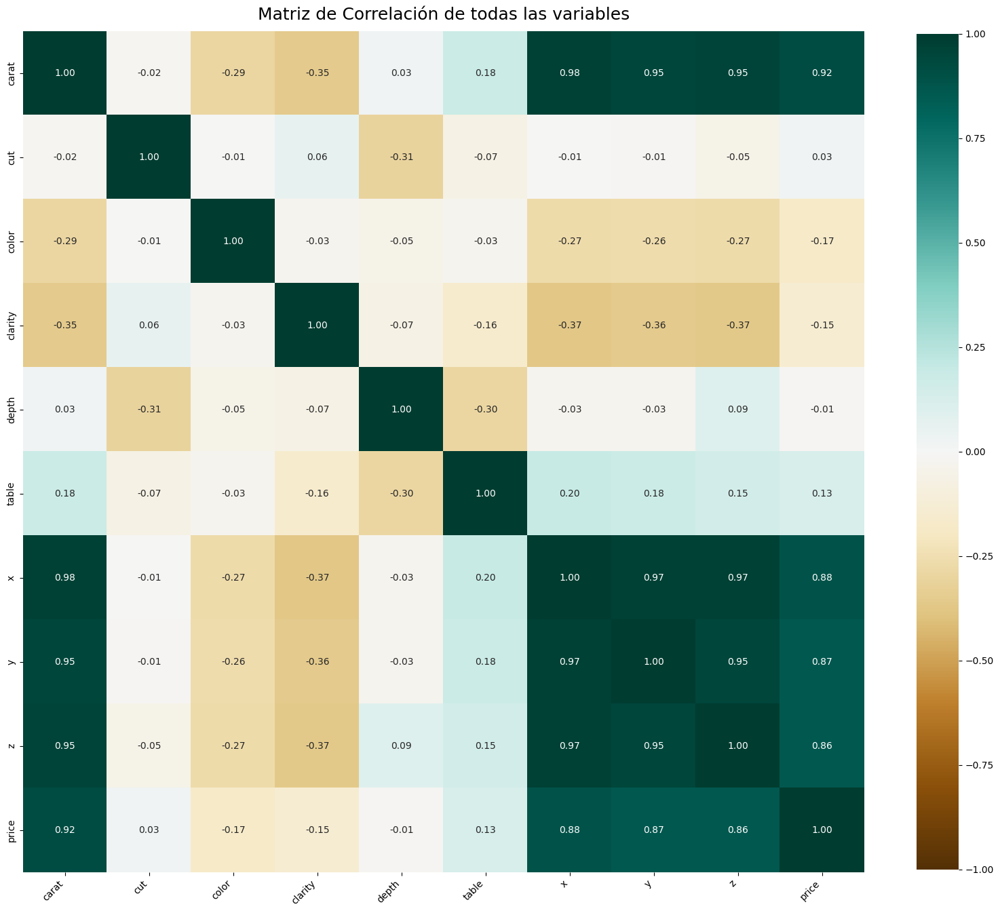

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(20, 20))
ax=sns.heatmap(df_copycat.corr(method='pearson'), vmin=-1, vmax=1, center=0,cmap='BrBG',annot=True, fmt=".2f",
            square=True,cbar=True,cbar_kws={"shrink": 0.8})
ax.set_title('Matriz de Correlación de todas las variables', fontdict={'fontsize':18}, pad=12);
ax.set_xticklabels(
 ax.get_xticklabels(),
 rotation=45,
 horizontalalignment='right'
)

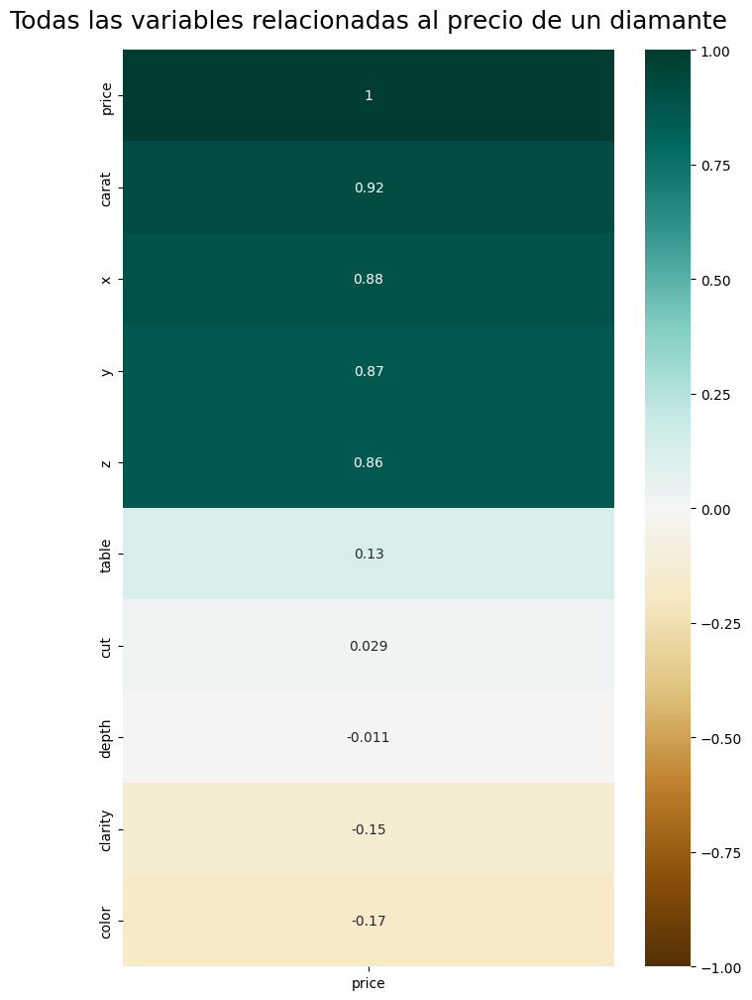

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df_copycat.corr()[['price']].sort_values(by='price', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Todas las variables relacionadas al precio de un diamante', fontdict={'fontsize':18}, pad=16);

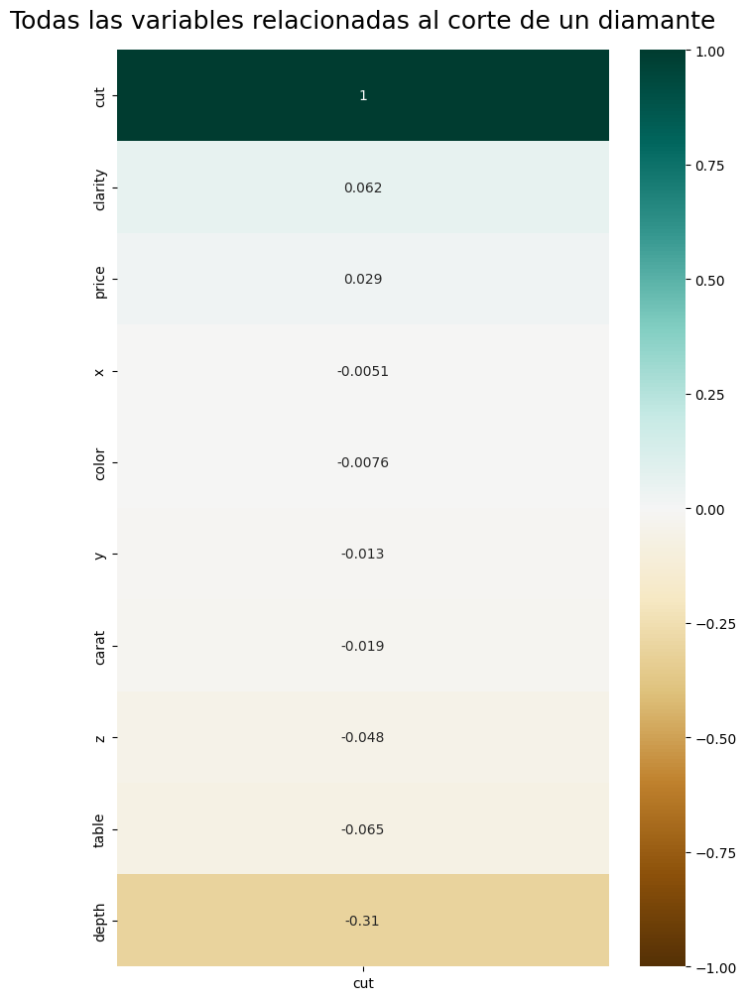

In [ ]:
mpl.rcParams.update(mpl.rcParamsDefault)
plt.figure(figsize=(8, 12))
heatmap = sns.heatmap(df_copycat.corr()[['cut']].sort_values(by='cut', ascending=False), vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Todas las variables relacionadas al corte de un diamante', fontdict={'fontsize':18}, pad=16);

Esta contemplación gráfica de la correlación se pueden identificar las variables con mayor correlación (es decir, que tengan un grado de 50% o más):

**Entre aquellas que no son el precio:**
- Los valores de longitud, anchura y profundidad en milímetros (X, Y y Z respectivamente) están muy relacionados entre ellos: Esto puede ser explicado a que estos tres atributos tienden a aumentar o reducir número de manera casi sincronizada en lo que uno de ellos altere su cifra.
- Las medidas de un diamante están conectadas al número de quilates de un diamante, esto probablemente debido a que a mayor tamaño, mayor el peso en miligramos que una piedra preciosa pueda adquirir.


**Con respecto al precio, de mayor a menor correlación:**
- El número de quilates de un diamante, así como sus medidas, influyen en su precio de venta; esto explicado en que una gema más valiosa es generalmente aquella con un mayor tamaño y peso.

**Con respecto al corte, de mayor a menor correlación:**
- La única variable que tiene algo de correlación, al menos en un 6%, es el diámetro del tope del diamante (table), esto debido a que la forma y tamaño de este atributo depende de cuál sea el tipo de corte, como se observa en esta imagen:

![picture](https://www.serendipitydiamonds.com/blog/wp-content/uploads/2021/06/Single-cut-diamond-compared-to-full-cut-diamond-diagram-850-1.jpg)

El precio le sigue con un 2%, indicando que el tipo de corte no tiene mucha relación con el costo de un diamante, etc. Así mismo, la profundidad del diamante tiene una relación negativa del 31%, indicando que, cuanto más sea la distancia entre el tope y la punta del diamante entre la franja central, peor será la calidad del corte, como se observa en la siguiente imágen:

![picture](https://selectingadiamond.com/wp-content/uploads/2018/08/Diamond-Cut-Light-Reflection.jpg)

Si bien, por norma, se podrían eliminar columnas con correlaciones entre ellas aparte del objetivo para aumentar el nivel de correlación, algunas de las variables son objeto de estudio del planteamiento del problema. Por lo tanto, no se borrarán atributos, y se verificará cuán precisa puede ser su evaluación en los distintos modelos

# **A. Predicción del precio de un diamante y relación con las variables**

Antes de realizar el modelo de predicción del rango de precio de un diamante con respecto a sus variables, se deben separar los atributos independientes del objetivo

In [ ]:
data_dia=df_copycat.drop("price",axis=1)
data_dia

,carat,cut,color,clarity,depth,table,x,y,z
1,0.23,3,5,1,61.5,55.0,3.95,3.98,2.43
2,0.21,4,5,2,59.8,61.0,3.89,3.84,2.31
3,0.23,1,5,4,56.9,65.0,4.05,4.07,2.31
4,0.29,4,1,3,62.4,58.0,4.20,4.23,2.63
5,0.31,1,0,1,63.3,58.0,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...
53936,0.72,3,6,2,60.8,57.0,5.75,5.76,3.50
53937,0.72,1,6,2,63.1,55.0,5.69,5.75,3.61
53938,0.70,2,6,2,62.8,60.0,5.66,5.68,3.56
53939,0.86,4,2,1,61.0,58.0,6.15,6.12,3.74


In [ ]:
pri_diam=df_copycat["price"]
pri_diam

1         326
2         326
3         327
4         334
5         335
         ... 
53936    2757
53937    2757
53938    2757
53939    2757
53940    2757
Name: price, Length: 53940, dtype: int64

## Modelo de árbol de decisión para ver predicciones del rango de precios y nivel de importancia de los atributos

El modelo del árbol de decisión tiene las siguientes consideraciones:

**Ventajas**
- Funciona no sólo para la clasificación de rangos de variables continuas, sino tambien para sectorizar variables cerradas o categóricas
- Su visualización, al ser de un sólo entrenamiento y prueba, es sencilla de interpretar, en la mayoría de los casos

**Desventajas**
- Los datos de evaluación deben estar lo más normalizados en lo posible, o la estabilidad del árbol de decisión puede ser alterada.
- Al ser de un sólo entrenamiento, se necesita saber el número de niveles máximo y los datos a evaluar por nodo mínimo, para que así su precisión sea ideal.


Por lo tanto, una vez generados los datos de entrenamiento y prueba, se procede a normalizar las variables independientes de ambos grupos, para luego determinar cuál sería su mejor configuración de predicción (niveles máximos y datos de muestra mínimos).

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

X_traina, X_testa, y_traina, y_testa = train_test_split(data_dia, pri_diam,test_size = 0.20, random_state=0)
scaler = MinMaxScaler()

scaler.fit(X_traina)

X_traina  = scaler.transform(X_traina)
X_testa = scaler.transform(X_testa)

dt = DecisionTreeRegressor(random_state=0)
dt_params = {'max_depth':np.arange(1,50,2),'min_samples_leaf':np.arange(2,15)}

from sklearn.model_selection import GridSearchCV
gs_dt = GridSearchCV(dt,dt_params,cv=3)
gs_dt.fit(X_traina,y_traina)
a = gs_dt.best_params_
gs_dt,a

(GridSearchCV(cv=3, estimator=DecisionTreeRegressor(random_state=0),
              param_grid={'max_depth': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
        35, 37, 39, 41, 43, 45, 47, 49]),
                          'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])}),
 {'max_depth': 13, 'min_samples_leaf': 10})

In [ ]:
from sklearn.tree import DecisionTreeRegressor

dtr=DecisionTreeRegressor(max_depth=13,min_samples_leaf=10)
model = dtr.fit(X_traina,y_traina)

y_pred = model.predict(X_testa)
y_pred

array([4755.64356436, 6992.4       , 5429.28571429, ..., 4244.72727273,
       8563.14285714, 1992.8       ])

El modelo ha determinado que, para una precisión más alta posible, el modelo de árbol de decisión debe tener máximo 13 niveles de profundidad y tomar al menos 10 muestras por nodo.

Para determinar cuán preciso y efectivo sería el modelo realizado, se realiza un cálculo del error base, tanto cuadrático como normal, de la predicción de resultados antes de ser analizada contra el máximo del precio del diamante (es decir, cuánto se aleja de la predicción). Un modelo que tenga estos dos atributos en valores menores a los base es el más apropiado

In [ ]:
baseline_errors = abs(max(pri_diam)- y_testa)
print('Error base del precio: ', round(np.mean(baseline_errors), 2))
print('Error base cuadrado del precio: ', round(np.mean(baseline_errors)**2, 2))

Error base del precio:  14893.79
Error base cuadrado del precio:  221824926.67


In [ ]:
errors = abs(y_pred - y_testa)
mape = 100 * (errors / y_pred)
accuracy = 100 - np.mean(mape)
print('Precisión del modelo:', round(accuracy, 2), '%.')

Precisión del modelo: 92.02 %.


In [ ]:
from sklearn.metrics import mean_squared_log_error
from sklearn.metrics import mean_absolute_error, mean_squared_error

msle=mean_squared_log_error(y_pred,y_testa)
rmsle=np.sqrt(msle)
print('RMLSE for the data:',rmsle) # Valor del Logaritmo de la raiz del error cuadrático medio. Si da con menos errores, está mejor
print('MAE:',mean_absolute_error(y_pred,y_testa)) # Valor del Error Absoluto Medio. Si el error es menor al base, está mejor
print('MSE:',mean_squared_error(y_pred,y_testa)) # Valor del Error Cuadrado Medio. Si el error es menor al base, está mejor

RMLSE for the data: 0.10870536328179066
MAE: 313.9919183527455
MSE: 381584.3341722532


Este error medio absoluto muestra una diferencia de 313.99 dólares del precio predecido contra el actual. Así mismo, el valor del Logaritmo de la raiz del error cuadrático medio revela un error de 0.10, y el Error Cuadrado Medio siendo de 381454.84 dólares, lo cual indica una buena precisión del modelo del arbol. La precisión, sacada de 100 menos la media de la diferencia absoluta entre los valores de prueba y predichos entre la longitud de la base de datos, llega a un 92.02%, lo cual indica un buen ajuste

Comparando los valores de errores medios contra los base, así como la cifra baja del RMLSE y la alta precisión obtenida, se puede ver que el modelo está óptimamente ajustado a los datos, pudiendo dar relaciones coherentes entre las variables normales ante el precio de un diamante.

A continuación, se hará una ilustración del árbol de decisión construido, así determinando la relación y relevancia de los atributos de análisis.

In [ ]:
from sklearn import tree
import graphviz
dot_data = tree.export_graphviz(dtr, out_file=None,feature_names=data_dia.columns,
                      filled=True, rounded=True,
                      special_characters=True)
graph = graphviz.Source(dot_data)
graph.render("precio_diam")

'precio_diam.pdf'

In [ ]:
dot_data = tree.export_graphviz(dtr, out_file=None,
                      feature_names=data_dia.columns,
                      filled=True, rounded=True,
                      special_characters=True)
graph = graphviz.Source(dot_data,format="png")
graph

Gracias a esta proyección del árbol de decisión, se pueden concluir las siguientes observaciones:

- El atributo más importante que determina el precio de un diamante es el número de quilates que este tenga. Esto es considerable en la realidad, ya que por lo general, las gemas de este tipo con mayor demanda son aquellas que tengan un mayor tamaño y peso, incluso siendo las que más revisiones tienen en cuanto a claridad, color, etc.

- Seguido de este valor, sigue el ancho (y) del diamante, con aquellas gemas con un ancho mayor a 8 mm ganando mejor precio: Esto puede probablemente deberse a que a mayor espacio tenga el diamante, más cortes se le pueden realizar.

- La claridad del diamante es el siguiente atributo a tomar en cuenta para predecir el precio. En esta predicción, mientras menos detalles tenga un diamante (su valor lejos de I1, S2 y S1), más puede ser codiciado.

- El color del diamante es una variable a considerar importante seguidamente. Un diamante que al menos tenga una coloración lejana a una oxidada (lejos de J, I y H) tiene mejores posibilidades de adquirir un valor más alto. Junto a la claridad, esto puede ser justificado en la realidad ya que por lo general, la gente busca diamantes sin imperfecciones y con un color blanco perfecto.

-  A continuación, el ancho del tope del diamante (table) es el que le sigue, con aquellos mayores a 46 mm ganando más precio: Mientras más ancho sea el diamante, más cortes perfectos puede tener y mejor será el precio.



In [ ]:
x = np.reshape(y_pred, (len(y_pred),1))
index_of_maximum = np.where(x == x.max())
x[index_of_maximum],index_of_maximum

(array([18336.64285714, 18336.64285714, 18336.64285714, 18336.64285714,
        18336.64285714]),
 (array([1379, 3122, 3970, 6436, 9484]), array([0, 0, 0, 0, 0])))

In [ ]:
data_dia.iloc[[1379, 3122, 3970, 6436, 9484]]

,carat,cut,color,clarity,depth,table,x,y,z
1380,0.79,3,2,3,62.0,56.0,5.91,5.93,3.67
3123,0.78,3,3,3,62.6,57.0,5.87,5.91,3.69
3971,0.90,0,5,2,65.5,59.0,6.06,6.03,3.96
6437,0.91,2,3,2,62.8,58.0,6.15,6.18,3.87
9485,1.02,2,2,3,63.3,55.0,6.40,6.33,4.03


In [ ]:
y_predN = model.predict([[0.79,3,2,3,62.0,56.0,5.91,5.93,3.67]])
y_predN2 = model.predict([[0.78,3,3,3,62.6,57.0,5.87,5.91,3.69]])
y_predN3 = model.predict([[0.90,0,5,2,65.5,59.0,6.06,6.03,3.96]])
y_predN4 = model.predict([[0.91,2,3,2,62.8,58.0,6.15,6.18,3.87]])
y_predN5 = model.predict([[1.02,2,2,3,63.3,55.0,6.40,6.33,4.03]])
y_predN,y_predN2,y_predN3,y_predN4,y_predN5

(array([16739.91666667]),
 array([16739.91666667]),
 array([16739.91666667]),
 array([16739.91666667]),
 array([16739.91666667]))

## Modelo de random forest para mejor elección de variables con relación al precio

El modelo del random forest tiene las siguientes consideraciones:

**Ventajas**
- Permite que las variables de evaluación de una base de datos tengan una libertad mayor de ser escogidas y evaluadas ante el atributo objetivo, siempre cambiando de iteraciones o estimadores para ver las posibles rutas creadas y la mejor de estas.
- No necesita normalizar los datos, ya que se basa más en la creación de reglas de asociación que distancia entre datos.
- No necesita todas las características para llegar a un valor de precisión alto. Resume la información a partir de estas variables

**Desventajas**
- Debe crear más de un árbol para llegar a una precisión del modelo ideal, es decir, ocupa tiempo y memoria de computación mientras más estimadores o iteraciones deba crear

Para determinar si las conclusiones de relaciones del árbol de decisión son las correctas, se realiza un modelo de random forest con las mismas secciones de entrenamiento y evaluación, pero con la diferencia de que, según las consideraciones antes detalladas, no es necesario una normalización de datos independientes.

Para evitar el consumo excesivo de RAM en el notebook, y considerando que es una base de datos con un número grande de registros, se determinó que el límite de estimadores en el random forest a realizar sean 300, una cifra no tan pequeña (se quiere una buena población de árboles en el bosque, es decir, mayor variedad de relaciones entre variables y precio posibles), y tampoco tan grande (mayor número de árboles a procesar significa más trabajo para el computador, y con ello la posibilidad de fallar del procesador del Colab)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
x_train2a,x_test2a,y_train2a,y_test2a = train_test_split(data_dia,pri_diam,test_size = 0.20 ,random_state = 2)
rf = RandomForestRegressor(n_estimators = 300, random_state = 42)
rf.fit(x_train2a, y_train2a);

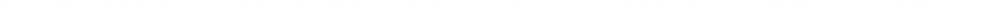

In [ ]:
from sklearn.tree import export_graphviz
import pydot
from IPython.display import Image, display
tree = rf.estimators_[3]
export_graphviz(tree, out_file = 'tree.dot', feature_names = data_dia.columns, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('tree.dot')
graph.write_png('tree.png');
from IPython.display import Image
Image("tree.png")

Una vez realizado un bosque de variables inicial, se procede a realiza una versión más pequeña: una extracción de a partir de 10 estimadores y 3 niveles máximos. A partir de esto, se puede obtener una visión general de la relación entre las variables con el precio, y cuán relevantes son estas en predecir el costo de un diamante

In [ ]:
rf_small = RandomForestRegressor(n_estimators=10, max_depth = 3)
rf_small.fit(x_train2a, y_train2a)
tree_small = rf_small.estimators_[5]

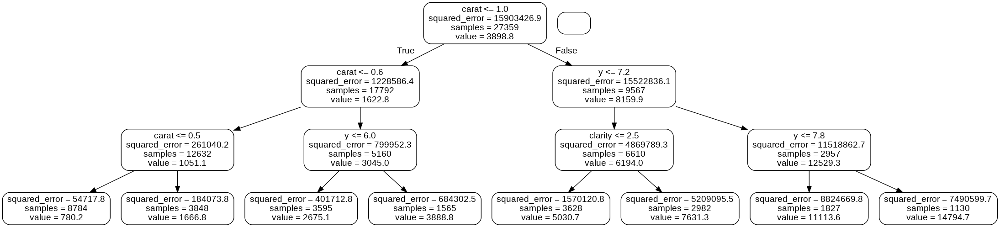

In [ ]:
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = data_dia.columns, rounded = True, precision = 1)
(graph, ) = pydot.graph_from_dot_file('small_tree.dot')
graph.write_png('small_tree.png');
from IPython.display import Image
Image("small_tree.png")

A partir de la revisión del árbol extraido del Random Forest, se puede observar que los quilates son otra vez el valor más importante de las variables, junto al ancho de los diamantes (y), y la claridad.

In [ ]:
importances = list(rf.feature_importances_)
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(data_dia.columns, importances)]
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
feature_im=feature_importances[0:5]
[print('Atributo: {:20} Relevancia: {}'.format(*pair)) for pair in feature_im];

Atributo: carat                Relevancia: 0.61
Atributo: y                    Relevancia: 0.28
Atributo: clarity              Relevancia: 0.06
Atributo: color                Relevancia: 0.03
Atributo: x                    Relevancia: 0.01


Se puede apreciar que, de todas las variables aplicadas al árbol de decisión generado por random forest, aquellas con mayor relevancia son el número de quilates, el ancho, la claridad, la coloración, y el alto del diamante

Con estas variables, se puede hacer una evaluación del nivel de precisión de este modelo, generando un nuevo set de variables de entrenamiento y prueba para encajarlos a un nuevo árbol de decisión, y así determinar su precisión

In [ ]:
rf_most_important = RandomForestRegressor(n_estimators= 300, random_state=42)
features=list(data_dia.columns)
important_indices = [features.index('carat'), features.index('y'),features.index('clarity'),features.index('color'),features.index('x')]
train_important = x_train2a.iloc[:, important_indices]
test_important = x_test2a.iloc[:, important_indices]

rf_most_important.fit(train_important, y_train2a)
predictions = rf_most_important.predict(test_important)
errors = abs(predictions - y_test2a)

print('Error medio absoluto:', round(np.mean(errors), 2), 'dólares.')
mape = np.mean(100 * (errors / y_test2a))
accuracy = 100 - mape
print('Precisión:', round(accuracy, 2), '%.')

Error medio absoluto: 292.87 dólares.
Precisión: 93.02 %.


In [ ]:
xp = np.reshape(predictions, (len(predictions),1))
index_of_maximump = np.where(xp == xp.max())
xp[index_of_maximump],index_of_maximump

(array([18225.]), (array([6579]), array([0])))

In [ ]:
data_dia.iloc[[0,6579]]

,carat,cut,color,clarity,depth,table,x,y,z
1,0.23,3,5,1,61.5,55.0,3.95,3.98,2.43
6580,0.90,1,6,1,64.0,59.0,6.04,6.09,3.88


In [ ]:
y_predN = model.predict([[0.23,3,5,1,61.5,55.0,3.95,3.98,2.43]])
y_predN2 = model.predict([[0.90,1,6,1,64.0,59.0,6.04,6.09,3.88]])
y_predN,y_predN2

(array([16739.91666667]), array([16739.91666667]))

Se puede observar que, en el árbol pequeño extraido del random forest generado, la precisión de la predicción es de 93.02%, siendo más alta que aquella del modelo anterior. Así mismo, el error medio absoluto es de 292.87 dólares, siendo menor a aquel de 313.91 dólares del modelo del árbol de decisión.

A partir de estos resultados, se puede concluir que la determinación de relaciones entre el precio de un diamante ante las variables que lo poseen es mejor planteada a partir de la generación de varios árboles de decisión que sólo uno. Adjunto a esto, se resuelven las preguntas planteadas en el problema:

1. ¿Las medidas de un diamante (x,y,z) influirán en el precio?

- R: Si. En especial la longitud y anchura del diamante (x,y). Esto puede ser detallado a partir de que estos dos factores dan al diamante una forma del tope más o menos amplia, y con ello mejores posibilidades de tener buenos cortes y quilates, los cuales dan un mejor costo a la piedra preciosa
2. ¿Cuanto se relacionan la claridad y el color de un diamante? ¿Alguno o ambos influyen en su precio?

- R: La claridad y el color de un diamante se relacionan, por lo general, en un 3% de manera negativa: Si una gema tiene una coloración, puede afectar su transparencia. Sin embargo, este valor bajo indica que no hay una varianza alta entre estos valores.

- En cuanto al precio, ambos factores influyen en su calidad: siendo primero el nivel de claridad ante el color, con un 6% y 3% respectivamente de correlación. Esto quiere decir que, a mayor valor de claridad (cercano a IF), mejor la calificación de color (recordando que J es el peor y D es el más ideal), y con ello, más codiciada será la piedra preciosa. Esto puede ser explicado en un contexto realista en el que por lo general, los mejores diamantes (al menos los blancos) han de ser transparentes y de una coloración blanquina, siendo aquellos con alguna imperfección o una coloración casi oxidada (amarilla) menos valuables.

3. ¿A qué quilates se obtiene un buen precio?

- R: Si bien hay un registro que indica que a 0.23 quilates se llega al precio máximo de 16739.91 dólares, este valor máximo se llega en general entre los 0.79 quilates a aquellos cercanos a 1.00 quilates

# **B. Clasificación y frecuencia de cortes de diamantes**

## Modelo K-nearest neighbors para ver predicciones de clase

Para determinar el nivel de relación entre las variables y si estas logran describir la clase de corte de un diamante lo suficiente, se determinó utilizar dos modelos:

- Uno con todas las variables relacionadas al precio, sin remover ninguna.
- Uno con aquellas 3 variables cuya correlación sea lo más lejana posible de 0, para determinar si sería una buena correlación

En ambos modelos, las clasificaciones por K-Nearest Neighbors serán realizadas en un rango de 1 a 50 vecinos, esto considerando la cantidad de datos enorme que se tiene en el dataset y a la vez el nivel de procesamiento del notebook (un valor a 50 podría trancarlo o tomarse el RAM entero, desconectando la sesión). Así mismo, se utilizarán grupos de entrenamiento y prueba, en una proporción 80/20 más utilizada por este tipo de aprendizaje automático; junto a una normalización de los conjuntos independientes X en escala de MinMax, esto debido a que se considera que hay datos muy extremos de máximos y/o mímimos en todas las columnas independientes numéricas que arruinan una distribución perfecta de datos, por lo que esta normalización podría ayudar a que este problema sea reducido a partir de estos datos outliers como referentes

**Con todas las variables**

In [ ]:
data_diam=df_copycat.drop("cut",axis=1)
data_diam

,carat,color,clarity,depth,table,x,y,z,price
1,0.23,5,1,61.5,55.0,3.95,3.98,2.43,326
2,0.21,5,2,59.8,61.0,3.89,3.84,2.31,326
3,0.23,5,4,56.9,65.0,4.05,4.07,2.31,327
4,0.29,1,3,62.4,58.0,4.20,4.23,2.63,334
5,0.31,0,1,63.3,58.0,4.34,4.35,2.75,335
...,...,...,...,...,...,...,...,...,...
53936,0.72,6,2,60.8,57.0,5.75,5.76,3.50,2757
53937,0.72,6,2,63.1,55.0,5.69,5.75,3.61,2757
53938,0.70,6,2,62.8,60.0,5.66,5.68,3.56,2757
53939,0.86,2,1,61.0,58.0,6.15,6.12,3.74,2757


In [ ]:
obj_diam=df_copycat["cut"]
obj_diam

1        3
2        4
3        1
4        4
5        1
        ..
53936    3
53937    1
53938    2
53939    4
53940    3
Name: cut, Length: 53940, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

X_train, X_test, y_train, y_test = train_test_split(data_diam, obj_diam,test_size = 0.20, random_state=0)
scaler = MinMaxScaler()
scaler.fit(X_train)

X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [ ]:
print("Forma del X train:", X_train.shape)
print("Forma del y train:", y_train.shape)

Forma del X train: (43152, 9)
Forma del y train: (43152,)


In [ ]:
print("Forma del X test:", X_test.shape)
print("Forma del y test: ", y_test.shape)

Forma del X test: (10788, 9)
Forma del y test:  (10788,)


In [ ]:
print("X test:", X_test)

X test: [[0.18711019 0.33333333 0.14285714 ... 0.11290323 0.12924528 0.23821367]
 [0.22661123 0.33333333 0.28571429 ... 0.11765705 0.13679245 0.32963884]
 [0.20790021 0.16666667 0.28571429 ... 0.11544992 0.13144654 0.28022275]
 ...
 [0.18295218 0.66666667 0.14285714 ... 0.11035654 0.12987421 0.19031142]
 [0.17047817 0.5        0.85714286 ... 0.1098472  0.12484277 0.4239295 ]
 [0.06237006 0.83333333 0.71428571 ... 0.08488964 0.10157233 0.08596453]]


**Con sólo las variables de mayor correlación posible**

In [ ]:
data_diam2=df_copycat.drop(["clarity","carat","color","z","y","x","cut"],axis=1)
data_diam2

,depth,table,price
1,61.5,55.0,326
2,59.8,61.0,326
3,56.9,65.0,327
4,62.4,58.0,334
5,63.3,58.0,335
...,...,...,...
53936,60.8,57.0,2757
53937,63.1,55.0,2757
53938,62.8,60.0,2757
53939,61.0,58.0,2757


In [ ]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(data_diam2, obj_diam,test_size = 0.20, random_state=0)
scaler2 = MinMaxScaler()
scaler2.fit(X_train2)

X_train2 = scaler2.transform(X_train2)
X_test2 = scaler2.transform(X_test2)

**Creando los clasificadores de K-Nearest Neighbors a partir de la iteración hasta 50 vecinos**

In [ ]:
def getbestclas(xtrain,ytrain,xtest,ytest):
  from sklearn.neighbors import KNeighborsClassifier
  best=0
  bestk=KNeighborsClassifier(n_neighbors=1)
  count=0
  neigh=0
  score=0
  for i in range(50):
    count=i+1
    knn = KNeighborsClassifier(n_neighbors=count)
    classifier = knn.fit(xtrain, ytrain)
    if knn.score(xtest, ytest)>best:
      bestk=KNeighborsClassifier(n_neighbors=count)
      neigh=count
      score=knn.score(xtest, ytest)
  return bestk,neigh,score


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn,best_n,best_sc=getbestclas(X_train, y_train,X_test,y_test)
clase=knn.fit(X_train, y_train)
print("Mejor modelo A con :",best_n,"vecinos con ",best_sc)

Mejor modelo A con : 50 vecinos con  0.6056729699666296


In [ ]:
knn2,best_n2,best_sc2=getbestclas(X_train2, y_train2,X_test2,y_test2)
clase=knn2.fit(X_train2, y_train2)
print("Mejor modelo B con :",best_n,"vecinos con ",best_sc2)

Mejor modelo B con : 50 vecinos con  0.6998516870596959


### **Predicciones**

**Con el modelo de todas las columnas**

In [ ]:
X_new1=np.array([[1.50,0,0,60,55,6.61,6.80,4.11,1289]])
print("X_new1 shape:", X_new1.shape)

X_new1 shape: (1, 9)


In [ ]:
prediction = knn.predict(X_new1)
print("Predicción:", prediction)
value = {i for i in cuts if cuts[i]==int(prediction)}
print("Corte predicho:", value)

Predicción: [4]
Corte predicho: {'Premium'}


**Con el modelo de columnas de profundidad, diámetro del tope, y precio**

In [ ]:
X_new2=np.array([[60,55,1289]])
print("X_new2 shape:", X_new2.shape)

X_new2 shape: (1, 3)


In [ ]:
prediction2 = knn2.predict(X_new2)
print("Predicción:", prediction)
value = {i for i in cuts if cuts[i]==int(prediction2)}
print("Corte predicho:", value)

Predicción: [4]
Corte predicho: {'Premium'}


### **Evaluaciones de los modelos**

Para evaluar la precisión de cada modelo ante la predicción de clases de cortes de un diamante ante sus variables, se utilizaron las siguientes métricas:

- Precisión del modelo KNN: Un valor cercano a 1.00 corresponde a un modelo bien adaptado, y es optimo cuando es al menos mayor al 60% (0.6)
- Matriz de confusión y reportes de clasificación: Mediante una matriz de confusión, se puede identificar qué bien califica las categorías predichas (verdaderos positivos) y cuán mal lo hace (verdaderos negativos y falsos positivos). Mientras más cantidad de verdaderos positivos haya, será mejor la precisión. Esto aporta a la precisión en promedio.
- Curva ROC-AUC: Una representación gráfica de la sensibilidad frente a la especificidad para un sistema de clasificación de variables. Para verificar cuán adaptado está el sistema, se debe verificar que la curva ROC de cada variable esté por encima de la métrica media del clasificador (la línea diagonal), y que sea lo más cuadrada posible (indicando que hay más valores verdaderos positivos que falsos positivos, es decir, más predicciones 100% correctas que falsas). El AUC (Area bajo la curva) señala cuán precisa es la distinción de una etiqueta frente a las otras, siendo mejor un valor cercano a 1 y lejos del 0.5

In [ ]:
from yellowbrick.classifier import ROCAUC
def plot_ROC_curve(model, xtrain, ytrain, xtest, ytest,dictcod):

    visualizer = ROCAUC(model, encoder=dictcod)

    visualizer.fit(xtrain, ytrain)
    visualizer.score(xtest, ytest)
    visualizer.show()

    return visualizer

In [ ]:
from sklearn.metrics import classification_report

**Modelo de todas las columnas**

In [ ]:
y_pred1=knn.predict(X_test)
print("Predicciones para el conjunto de test 1: ", y_pred1)
from collections import Counter
counter_object = Counter(y_pred1)
print(counter_object.keys(),counter_object.values())

Predicciones para el conjunto de test 1:  [3 3 4 ... 2 3 3]
dict_keys([3, 4, 1, 0, 2]) dict_values([5801, 3669, 256, 52, 1010])


In [ ]:
print("Porcentaje en el test 1: {:.2f}".format(np.mean(y_pred1 == y_test)))
print("Porcentaje en el test 1: {:.2f}".format(knn.score(X_test, y_test)))

Porcentaje en el test 1: 0.61
Porcentaje en el test 1: 0.61


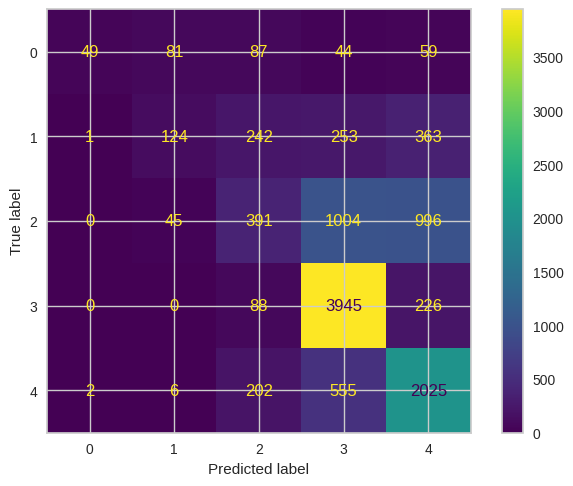

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test, y_pred1)
plt.show()

In [ ]:
print(classification_report(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.94      0.15      0.26       320
           1       0.48      0.13      0.20       983
           2       0.39      0.16      0.23      2436
           3       0.68      0.93      0.78      4259
           4       0.55      0.73      0.63      2790

    accuracy                           0.61     10788
   macro avg       0.61      0.42      0.42     10788
weighted avg       0.57      0.61      0.55     10788



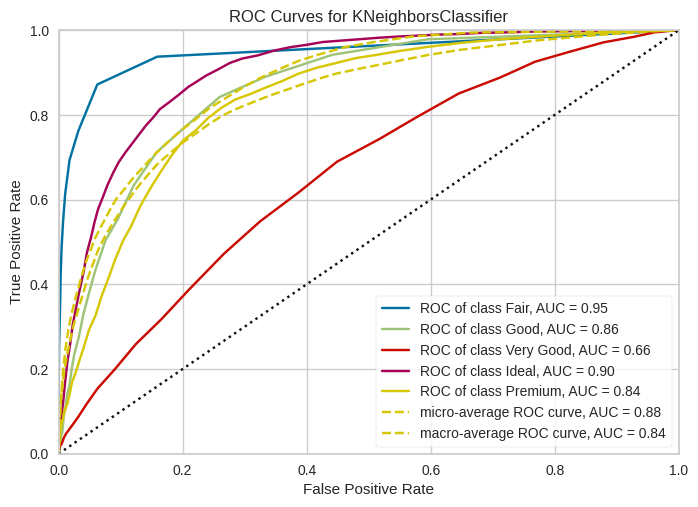

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5c49d9290>,
       encoder={0: 'Fair', 1: 'Good', 2: 'Very Good', 3: 'Ideal', 4: 'Premium'},
       estimator=KNeighborsClassifier(n_neighbors=50))

In [ ]:
plot_ROC_curve(knn, X_test, y_train, X_test, y_test,{0:"Fair",1:"Good",2:"Very Good",3:"Ideal",4:"Premium"})

En el primer modelo, se puede observar las siguientes observaciones:

- En predicciones randómicas sin regular, hay más cantidad de diamantes de corte Premium e Ideal (5801 y 3669), y en una regulación de verdaderos positivos por matriz de correlación, son 3945 y 2025 registros de estas clases posibles.

- Las curvas ROC con la mejor sensibilidad y especificidad, es decir, una curva más cuadrada posible, son aquellas de diamantes de corte Regular (Curva AUC de 95%), Ideal (Curva AUC de 90%), Good (Curva AUC de 86%) y Premium (Curva AUC de 84%). Sus medidas de AUC, siendo más cercanas a 100%, son las más adaptadas.

- La precisión del modelo en general es de 61%, lo cual es óptimo

**Modelo de columnas de profundidad, tope y precio**

In [ ]:
y_pred2=knn2.predict(X_test2)
print("Predicciones para el conjunto de test 1: ", y_pred2)
from collections import Counter
counter_object = Counter(y_pred2)
print(counter_object.keys(),counter_object.values())

Predicciones para el conjunto de test 1:  [3 3 4 ... 2 3 1]
dict_keys([3, 4, 2, 1, 0]) dict_values([5024, 3694, 1151, 722, 197])


In [ ]:
print("Porcentaje en el test 2: {:.2f}".format(np.mean(y_pred2 == y_test2)))
print("Porcentaje en el test 2: {:.2f}".format(knn2.score(X_test2, y_test2)))

Porcentaje en el test 2: 0.70
Porcentaje en el test 2: 0.70


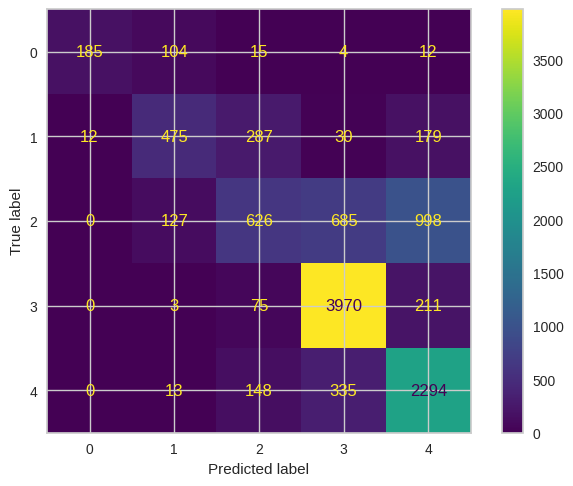

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test2, y_pred2)
plt.show()

In [ ]:
print(classification_report(y_test2, y_pred2))

              precision    recall  f1-score   support

           0       0.94      0.58      0.72       320
           1       0.66      0.48      0.56       983
           2       0.54      0.26      0.35      2436
           3       0.79      0.93      0.86      4259
           4       0.62      0.82      0.71      2790

    accuracy                           0.70     10788
   macro avg       0.71      0.61      0.64     10788
weighted avg       0.68      0.70      0.67     10788



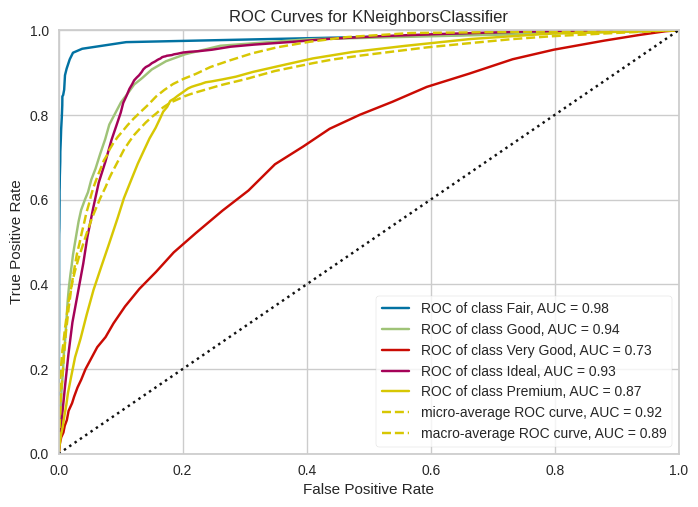

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5bdc97d90>,
       encoder={0: 'Fair', 1: 'Good', 2: 'Very Good', 3: 'Ideal', 4: 'Premium'},
       estimator=KNeighborsClassifier(n_neighbors=50))

In [ ]:
plot_ROC_curve(knn2, X_test2, y_train2, X_test2, y_test2,{0:"Fair",1:"Good",2:"Very Good",3:"Ideal",4:"Premium"})

En el segundo modelo, se pueden observar las siguientes observaciones:

- En predicciones randómicas sin regular, hay más cantidad de diamantes de corte Muy Bueno, Premium e Ideal (5024, 3694 y 1151 respectivamente), y en una regulación de verdaderos positivos por matriz de correlación, son 3970, 2294 y 626 registros de estas clases posibles. Comparando al anterior modelo, se puede ver que las clases Ideal y Premium tienen mejor adaptación y presencia apropiada

- Las curvas ROC con la mejor sensibilidad y especificidad, es decir, una curva más cuadrada posible, son aquellas de diamantes de corte Regular (Curva AUC de 98%), Ideal (Curva AUC de 93%), Good (Curva AUC de 94%) y Premium (Curva AUC de 87%). Sus medidas de AUC, siendo más cercanas a 100%, son las más adaptadas. Comparándolas al anterior modelo, se puede observar que hay mejor distinción entre las clases al tomar sólo tres columnas relevantes.

- La precisión del modelo en general es de 70%, lo cual es ideal y a la vez mejor adaptado que en el anterior modelo.

## Naive-Bayes para la probabilidad de pertenencia de un corte de diamante ante los atributos planteados

El modelo de clasificación Naive-Bayes se basa en la probabilidad de un atributo de la información, independientemente de otras sin importar su correlación, en una clase, y de esta última según otras. Esto indica que su precisión ante la información que se utiliza en este trabajo pueda ser más baja, ya que hay variables que codependen unas de otras.

Sin embargo, a pesar de esta consideración, se quiere explorar cuán sería la diferencia de precisión entre los modelos con este algoritmos y los anteriores con K-Nearest Neighbors, y determinar cuál de estos cálculos da una mejor descripción del dataset, y con ello responder a la problemática planteada.

**Modelo con todas las columnas**

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

classifier_GaussianNB = GaussianNB()

classifier_GaussianNB.fit(X_train, y_train)

y_pred3 = classifier_GaussianNB.predict(X_test)
print(classification_report(y_test, y_pred3))
print(confusion_matrix(y_test, y_pred3))

# Accuracy score
print('accuracy is',accuracy_score(y_pred3,y_test))

              precision    recall  f1-score   support

           0       0.57      0.45      0.50       320
           1       0.41      0.21      0.28       983
           2       0.39      0.25      0.30      2436
           3       0.68      0.85      0.75      4259
           4       0.53      0.60      0.56      2790

    accuracy                           0.58     10788
   macro avg       0.51      0.47      0.48     10788
weighted avg       0.55      0.58      0.55     10788

[[ 143  156    9    2   10]
 [  68  209  395  154  157]
 [  23   94  601  916  802]
 [  10    5  107 3606  531]
 [   9   48  415  652 1666]]
accuracy is 0.5770300333704116


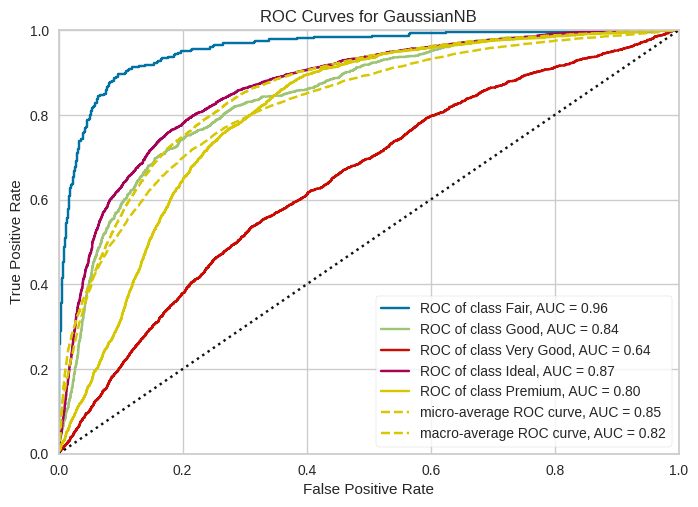

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5bae9eed0>,
       encoder={0: 'Fair', 1: 'Good', 2: 'Very Good', 3: 'Ideal', 4: 'Premium'},
       estimator=GaussianNB())

In [ ]:
plot_ROC_curve(classifier_GaussianNB, X_train, y_train, X_test, y_test,{0:"Fair",1:"Good",2:"Very Good",3:"Ideal",4:"Premium"})

En el primer modelo con Naive-Bayes Gaussiano, se puede observar las siguientes observaciones:

- En predicciones randómicas reguladas de verdaderos positivos por matriz de correlación, las clases con mayor precisión son la Premium e Ideal, con 3606 y 1666, cifras menores al modelo de KNN con las mismas clases.

- Las curvas ROC con la mejor sensibilidad y especificidad, es decir, una curva más cuadrada posible, son aquellas de diamantes de corte Regular (Curva AUC de 96%), Ideal (Curva AUC de 87%), Good (Curva AUC de 84%) y Premium (Curva AUC de 80%). Sus medidas de AUC, siendo más cercanas a 100%, son las más adaptadas; aunque con menos valores en el caso de los cortes diferentes a Fair.

- La precisión del modelo en general es de 57%, menor al del modelo con KNN.

**Modelo de columnas de profundidad, tope y precio**

In [ ]:
classifier_GaussianNB2 = GaussianNB()

classifier_GaussianNB2.fit(X_train2, y_train2)

y_pred4 = classifier_GaussianNB2.predict(X_test2)
print(classification_report(y_test2, y_pred4))
print(confusion_matrix(y_test2, y_pred4))

# Accuracy score
print('accuracy is',accuracy_score(y_pred4,y_test2))

              precision    recall  f1-score   support

           0       0.89      0.25      0.39       320
           1       0.42      0.22      0.29       983
           2       0.40      0.21      0.27      2436
           3       0.72      0.92      0.81      4259
           4       0.59      0.72      0.64      2790

    accuracy                           0.62     10788
   macro avg       0.60      0.46      0.48     10788
weighted avg       0.59      0.62      0.58     10788

[[  81  183   46    2    8]
 [   9  219  492  100  163]
 [   1   92  501  889  953]
 [   0    2   36 3931  290]
 [   0   28  190  575 1997]]
accuracy is 0.6237486095661846


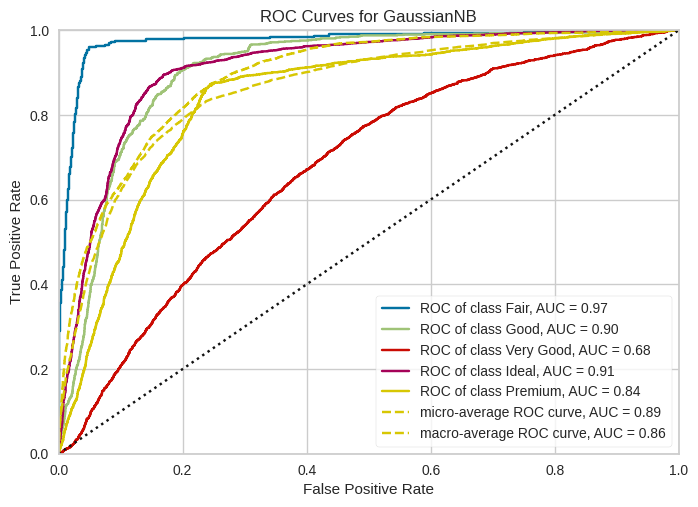

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fd5b6e06790>,
       encoder={0: 'Fair', 1: 'Good', 2: 'Very Good', 3: 'Ideal', 4: 'Premium'},
       estimator=GaussianNB())

In [ ]:
plot_ROC_curve(classifier_GaussianNB2, X_train2, y_train2, X_test2, y_test2,{0:"Fair",1:"Good",2:"Very Good",3:"Ideal",4:"Premium"})

En el segundo modelo con Naive-Bayes Gaussiano, se puede observar las siguientes observaciones:

- En predicciones randómicas reguladas de verdaderos positivos por matriz de correlación, las clases con mayor precisión son la Premium e Ideal, con 3931 y 1997, cifras menores al modelo de KNN con las mismas clases y las mismas columnas; pero mayores al modelo anterior de NB con todas las variables.

- Las curvas ROC con la mejor sensibilidad y especificidad, es decir, una curva más cuadrada posible, son aquellas de diamantes de corte Regular (Curva AUC de 97%), Ideal (Curva AUC de 91%), Good (Curva AUC de 90%) y Premium (Curva AUC de 84%). Sus medidas de AUC, siendo más cercanas a 100%, son las más adaptadas; aunque con menos valores en el caso de los cortes diferentes a Fair.

- La precisión del modelo en general es de 62%, menor al del modelo con KNN pero mayor al anterior de NB con todas las columnas.

In [ ]:
sumVP=185+475+626+3970+2294
print("Probabilidades de diamantes Premium : {:.2f}".format(2294/sumVP*100))
print("Probabilidades de diamantes Fair : {:.2f}".format(185/sumVP*100))

Probabilidades de diamantes Premium : 30.38
Probabilidades de diamantes Fair : 2.45


**Tomando los índices del array de predicción con los valores mayores**

In [ ]:
imax = np.where(y_pred2 == y_pred2.max())
y_pred2[imax],imax

(array([4, 4, 4, ..., 4, 4, 4]),
 (array([    2,     6,    13, ..., 10781, 10782, 10784]),))

In [ ]:
filterd=data_diam.iloc[imax]
filterd

,carat,color,clarity,depth,table,x,y,z,price
3,0.23,5,4,56.9,65.0,4.05,4.07,2.31,327
7,0.24,1,6,62.3,57.0,3.95,3.98,2.47,336
14,0.31,0,1,62.2,54.0,4.35,4.37,2.71,344
16,0.32,5,0,60.9,58.0,4.38,4.42,2.68,345
18,0.30,0,2,63.4,54.0,4.23,4.29,2.70,351
...,...,...,...,...,...,...,...,...,...
10777,1.08,5,1,63.4,56.0,6.55,6.50,4.14,4857
10780,0.90,5,3,62.7,56.0,6.13,6.21,3.87,4858
10782,0.93,5,1,60.5,54.0,6.40,6.38,3.87,4858
10783,1.24,1,3,61.2,58.0,6.94,6.89,4.23,4858


In [ ]:
filterd.describe()

,carat,color,clarity,depth,table,x,y,z,price
count,3694.000000,3694.000000,3694.000000,3694.000000,3694.000000,3694.000000,3694.000000,3694.000000,3694.000000
mean,0.854375,3.376015,2.375474,61.842718,57.807851,6.008235,6.009234,3.713725,3464.085003
std,0.234074,1.768999,1.474966,1.656076,2.311634,0.655661,0.645587,0.418035,1147.018288
min,0.220000,0.000000,0.000000,43.000000,50.000000,3.830000,3.850000,0.000000,327.000000
25%,0.730000,2.000000,1.000000,61.000000,56.000000,5.790000,5.810000,3.570000,3056.250000
50%,0.900000,3.000000,2.000000,61.900000,58.000000,6.150000,6.160000,3.830000,3701.000000
75%,1.010000,5.000000,3.000000,62.800000,59.000000,6.420000,6.420000,3.990000,4281.500000
max,1.580000,6.000000,7.000000,70.600000,68.000000,7.550000,7.510000,4.840000,4859.000000


In [ ]:
filterdm=filterd[(filterd.depth>=filterd.depth.median()) & (filterd.table>=filterd.table.median())]
filterdm

,carat,color,clarity,depth,table,x,y,z,price
20,0.30,0,2,62.7,59.0,4.21,4.27,2.66,351
35,0.23,6,4,61.9,58.0,3.92,3.96,2.44,402
37,0.23,5,4,64.1,59.0,3.83,3.85,2.46,402
62,0.30,6,2,62.6,59.0,4.23,4.27,2.66,552
79,0.26,6,5,62.8,60.0,4.01,4.05,2.53,554
...,...,...,...,...,...,...,...,...,...
10689,1.01,5,2,65.3,59.0,6.13,6.19,4.02,4844
10736,0.33,1,3,62.6,58.0,4.42,4.34,2.74,594
10747,1.00,4,2,62.8,59.0,6.32,6.36,3.98,4851
10748,1.00,4,2,63.4,61.0,6.29,6.35,4.01,4851


In [ ]:
listmax=[]
filt=filterdm
for row in filt.index:
  y_predM=knn2.predict([[filt["depth"][row],filt["table"][row],filt["price"][row]]])
  listmax.append(y_predM[0])
counter_objectpr = Counter(listmax)
print(counter_objectpr.keys(),counter_objectpr.values())

dict_keys([4, 3]) dict_values([339, 585])


A partir del procesamiento de estas clasificaciones, se determina que, por mejor precisión ante tanto todas las columnas como con aquellas con más correlación al corte, el modelo que mejor explica la relación del corte de un diamante con respecto a sus variables es el modelo de K-Nearest Neighbors.

Revisando las predicciones de este modelo, se pueden responder las preguntas del planteamiento:
1. ¿Será el color una propiedad determinante?
- No. En sí, su relación con el corte es muy baja, es decir, no afecta mucho en su calidad. Esto es cierto en la realidad, ya que por lo general, el número de divisiones de un diamante es independiente del color
2. ¿A mayor depth (nivel de profundidad) y table (Ancho/diámetro del tope), mejor calidad del corte?
- No del todo. Aquellos diamantes con una profundidad y ancho del tope mayor a la mediana tienen mejor oportunidad de tener una calidad de corte Ideal o Premium, pero en menor cantidad que otros cortes. Esto puede deberse a que, como se explicó antes, mientras más "alto" sea el diamante, su corte será menos óptimo.
3. ¿Cuán frecuente será la probabilidad de obtener un diamante de corte prestigioso (Premium) y del peor (Fair)?
- A partir del cálculo entre el total de cifras verdaderamente positivas del modelo de sólo 3 columnas, es decir, una respuesta garantizada, será en un 30.38% la calidad de diamantes con el mejor corte Premium y 2.45% de diamantes del peor corte (Fair)
4. ¿A que medidas (x,y,z) se obtiene un corte prestigioso (Premium) de diamantes?
- Los diamantes de corte Premium, según el mejor clasificador, pueden ser adquiridos entre 3.83 a 7.55 mm de longitud, 3.85 a 7.51 mm de anchura, y menos o igual a 4.84 mm de altura.

# **C: Extra. Uso de red neuronal de Keras-Tensorflow para la predicción del precio**

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras import optimizers

Para desarrollar la red neuronal que haga predicciones del precio, se determinó el uso de una red que utilice 9 entradas (los atributos independientes del precio), así como dos capas Dense de 64 unidades y una de 32, para así tener una consistencia de la red neuronal. Todas, con el objetivo de mantener una gradiente apropiada, se activan con la función "relu", y se prevee que sean solo 3 capas para evitar la muerte de neuronas. Para evitar en lo posible un overfitting, se determinó el uso del dropout: eliminación de neuronas aleatorias, esto en un 30% de la red neuronal para comprobar el nivel de mejora del grupo de prueba ante el de entrenamiento. La salida será una capa Densa de una sola unidad, siendo el valor continuo del precio.

Para compilar este modelo, se utiliza un optimizador de la clase RMSprop, un algoritmo que mantiene un promedio de las gradientes, y dividirlas por este valor para estimar una varianza que mantenga el aprendizaje óptimo. Las métricas de pérdida y precisión serán el Error Cuadrado Medio y Error Promedio Medio, en los cuales un valor mínimo al Error base del modelo del árbol y al MSE/MAE del modelo del árbol de decisión diseñado sea el mejor. Se espera que al menos, el modelo de validación llegue a cumplir este objetivo

In [ ]:
modelo=Sequential([
    layers.Dense(64,activation='relu',input_shape=(9,)),
    layers.Dense(64,activation='relu'),
    layers.Dense(32,activation='relu'),
    layers.Dropout(0.30),
    layers.Dense(1)
])

modelo.compile(optimizer=optimizers.RMSprop(learning_rate=0.001),
              loss='mse',
              metrics=['mae'])

In [ ]:
modelo.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                640       
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
 dense_2 (Dense)             (None, 32)                2080      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 6,913
Trainable params: 6,913
Non-trainable params: 0
_________________________________________________________________


**Diseñando los sets de entrenamiento, normalizándolos, y ejecutando el modelo**

In [ ]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(data_dia, pri_diam,test_size = 0.20, random_state=0)

In [ ]:
scaler = StandardScaler()

scaler.fit(X_train3)

X_train3  = scaler.transform(X_train3)
X_test3 = scaler.transform(X_test3)

In [ ]:
epochs=500
history = modelo.fit(
  X_train3,y_train3,
  epochs=epochs,
  validation_split=0.2
  )

Epoch 1/500
1079/1079 [==============================] - 3s 2ms/step - loss: 8501133.0000 - mae: 1583.2686 - val_loss: 1230647.7500 - val_mae: 646.5594
Epoch 2/500
1079/1079 [==============================] - 2s 2ms/step - loss: 2032279.7500 - mae: 795.5875 - val_loss: 1120869.1250 - val_mae: 582.0530
Epoch 3/500
1079/1079 [==============================] - 2s 2ms/step - loss: 2027142.7500 - mae: 767.2793 - val_loss: 1092408.2500 - val_mae: 555.5803
Epoch 4/500
1079/1079 [==============================] - 2s 2ms/step - loss: 1922838.8750 - mae: 736.1744 - val_loss: 1061164.0000 - val_mae: 529.0695
Epoch 5/500
1079/1079 [==============================] - 2s 2ms/step - loss: 1984302.7500 - mae: 712.8583 - val_loss: 1058723.3750 - val_mae: 488.4996
Epoch 6/500
1079/1079 [==============================] - 2s 2ms/step - loss: 1775568.1250 - mae: 697.4147 - val_loss: 1039746.6250 - val_mae: 471.6533
Epoch 7/500
1079/1079 [==============================] - 2s 2ms/step - loss: 1772556.0000 - m

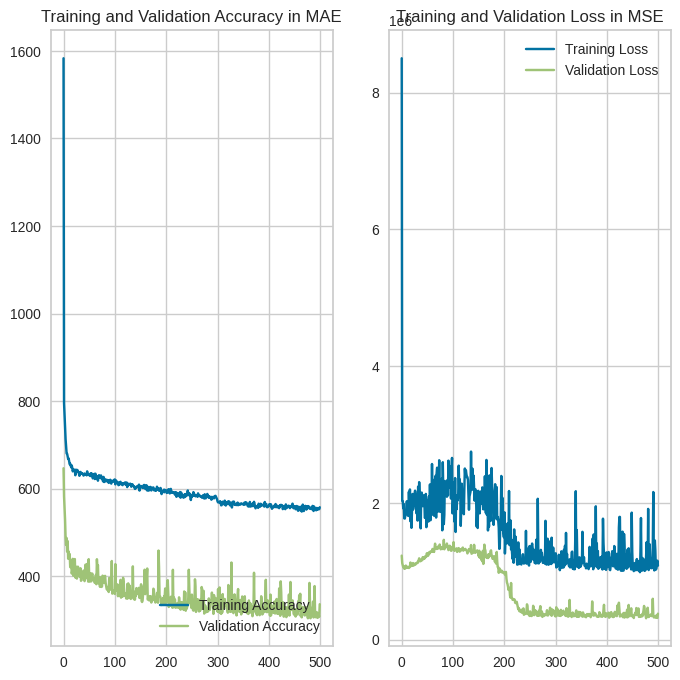

In [ ]:
acc = history.history['mae']
val_acc = history.history['val_mae']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy in MAE')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='best')
plt.title('Training and Validation Loss in MSE')
plt.show()

In [ ]:
min(history.history['val_loss']),min(history.history['val_mae'])

(314851.15625, 303.8507385253906)

A partir de la creación de una red neuronal de Keras, se puede observar que, si bien el set de entrenamiento no llega a rebajar del todo la cifra del MAE y MSE antes conseguidos en el árbol de decisión, el set de prueba si lo logra: llegando cerca a 303.85 y 314851.15 dólares respectivamente.

Para realizar predicciones con respecto al precio posible gracias a esta red neuronal, se determinó llenar los datos con los mayores valores de las columnas numéricas de medida, y tanto con los datos media de clasificadores (claridad, color, corte) como con los mínimos, determinando así el valor del precio posible

In [ ]:
data_dia.carat.mean(),data_dia.depth.mean(),data_dia.table.mean(),data_dia.x.mean(),data_dia.y.mean(),data_dia.z.mean()

(0.7979397478680014,
 61.749404894327036,
 57.45718390804598,
 5.731157211716722,
 5.734525954764553,
 3.5387337782721544)

In [ ]:
test_data=np.array([0.79,4,6,7,61.74,57.45,5.73,5.73,3.53])
print(modelo.predict(test_data.reshape(1,9),batch_size=1))

1/1 [==============================] - 0s 93ms/step
[[67852.5]]


In [ ]:
test_data=np.array([0.79,0,0,0,61.74,57.45,5.73,5.73,3.53])
print(modelo.predict(test_data.reshape(1,9),batch_size=1))

1/1 [==============================] - 0s 14ms/step
[[39987.91]]


Gracias a estas predicciones, se puede concluir que la claridad, color y calidad del corte influyen mucho en el valor del precio, siendo este más alto en un corte cercano al tipo Premium, una claridad alta, y un color cristalino

# **Conclusiones finales:**

Podemos concluir que, con la información que hemos obtenido del dataset y los modelos que hemos desarrollado, hemos logrado resolver las problemáticas que más nos llamaron la atención: predecir el precio y el corte de un diamante con los atributos que este tiene.

Podríamos agregarle nuevos atributos, como el ancho del medio del diamante (girdle), el año de creación y su nivel de refinamiento (considerando que hay diamantes en bruto y otros ya refinados para su venta en las joyerías); viendo así como esto cambiaría la precisión de los modelos que utilizamos para predecir el costo y corte de estas gemas.

Así mismo, gracias a este trabajo, hemos logrado repasar todo lo aprendido en la materia al aplicar lo necesario a nuestra información, probando distintas técnicas para llegar a que nuestros modelos sean lo más precisos posible.

[Link a la versión Google Colab](https://colab.research.google.com/drive/1HG63lunDCANPO98PkcG4QNdF7tF4kvOS?usp=sharing)